#### Background & Context

The Thera bank recently saw a steep decline in the number of users of their credit card, credit cards are a good source of income for banks because of different kinds of fees charged by the banks like annual fees, balance transfer fees, and cash advance fees, late payment fees, foreign transaction fees, and others. Some fees are charged to every user irrespective of usage, while others are charged under specified circumstances.

Customers’ leaving credit cards services would lead bank to loss, so the bank wants to analyze the data of customers and identify the customers who will leave their credit card services and reason for same – so that bank could improve upon those areas

You as a Data scientist at Thera bank need to <b>come up with a classification model that will help the bank improve its services so that customers do not renounce their credit cards</b>

You need to identify the best possible model that will give the required performance

#### Objective

* Explore and visualize the dataset.
* Build a classification model to predict if the customer is going to churn or not
* Optimize the model using appropriate techniques
* Generate a set of insights and recommendations that will help the bank

#### Data Dictionary


* CLIENTNUM: Client number. Unique identifier for the customer holding the account
* Attrition_Flag: Internal event (customer activity) variable - if the account is closed then "Attrited Customer" else "Existing Customer"
* Customer_Age: Age in Years
* Gender: Gender of the account holder
* Dependent_count: Number of dependents
* Education_Level:  Educational Qualification of the account holder - Graduate, High School, Unknown, Uneducated, * * * College(refers to a college student), Post-Graduate, Doctorate.
* Marital_Status: Marital Status of the account holder
* Income_Category: Annual Income Category of the account holder
* Card_Category: Type of Card
* Months_on_book: Period of relationship with the bank
* Total_Relationship_Count: Total no. of products held by the customer
* Months_Inactive_12_mon: No. of months inactive in the last 12 months
* Contacts_Count_12_mon: No. of Contacts between the customer and bank in the last 12 months
* Credit_Limit: Credit Limit on the Credit Card
* Total_Revolving_Bal: The balance that carries over from one month to the next is the revolving balance
* Avg_Open_To_Buy: Open to Buy refers to the amount left on the credit card to use (Average of last 12 months)
* Total_Trans_Amt: Total Transaction Amount (Last 12 months)
* Total_Trans_Ct: Total Transaction Count (Last 12 months)
* Total_Ct_Chng_Q4_Q1: Ratio of the total transaction count in 4th quarter and the total transaction count in 1st quarter
* Total_Amt_Chng_Q4_Q1: Ratio of the total transaction amount in 4th quarter and the total transaction amount in 1st quarter
* Avg_Utilization_Ratio: Represents how much of the available credit the customer spent


## Importing libraries

In [1]:
# To help with reading and manipulating data
import pandas as pd
import numpy as np

# To help with data visualization
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

# To be used for missing value imputation
from sklearn.impute import SimpleImputer

# To help with model building
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (
    AdaBoostClassifier,
    GradientBoostingClassifier,
    RandomForestClassifier,
    BaggingClassifier,
)
from xgboost import XGBClassifier

# To get different metric scores, and split data
from sklearn import metrics
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    roc_auc_score,
    plot_confusion_matrix,
)

# To be used for data scaling and one hot encoding
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder

# To be used for tuning the model
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

# To be used for creating pipelines and personalizing them
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

# To oversample and undersample data
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

# To define maximum number of columns to be displayed in a dataframe
pd.set_option("display.max_columns", None)

# To supress scientific notations for a dataframe
pd.set_option("display.float_format", lambda x: "%.3f" % x)

# To supress warnings
import warnings

warnings.filterwarnings("ignore")

# This will help in making the Python code more structured automatically (good coding practice)
#%load_ext nb_black

## Loading Data

In [2]:
# load data

# Loading the dataset
bank = pd.read_csv("BankChurners.csv")

In [3]:
bank.shape

(10127, 21)

In [4]:
data = bank.copy()

## Data Overview

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           8608 non-null   object 
 6   Marital_Status            9378 non-null   object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

In [6]:
data.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.000,777,11914.000,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.000,864,7392.000,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.000,0,3418.000,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,3,4,1,3313.000,2517,796.000,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.000,0,4716.000,2.175,816,28,2.500,0.000


In [7]:
data.tail()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,3,2,3,4003.000,1851,2152.000,0.703,15476,117,0.857,0.462
10123,710638233,Attrited Customer,41,M,2,NaN,Divorced,$40K - $60K,Blue,25,4,2,3,4277.000,2186,2091.000,0.804,8764,69,0.683,0.511
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,5,3,4,5409.000,0,5409.000,0.819,10291,60,0.818,0.000
10125,717406983,Attrited Customer,30,M,2,Graduate,NaN,$40K - $60K,Blue,36,4,3,3,5281.000,0,5281.000,0.535,8395,62,0.722,0.000
10126,714337233,Attrited Customer,43,F,2,Graduate,Married,Less than $40K,Silver,25,6,2,4,10388.000,1961,8427.000,0.703,10294,61,0.649,0.189


### Check for duplicate records

In [8]:
data.duplicated().sum()

0

### Target Variable 

In [9]:
data.Attrition_Flag.value_counts(1) * 100

Existing Customer   83.934
Attrited Customer   16.066
Name: Attrition_Flag, dtype: float64

Target Variable - Almost 16% customers are attrited Customer. Also data is imbalanced

In [10]:
# check unique value for each column

data.nunique()

CLIENTNUM                   10127
Attrition_Flag                  2
Customer_Age                   45
Gender                          2
Dependent_count                 6
Education_Level                 6
Marital_Status                  3
Income_Category                 6
Card_Category                   4
Months_on_book                 44
Total_Relationship_Count        6
Months_Inactive_12_mon          7
Contacts_Count_12_mon           7
Credit_Limit                 6205
Total_Revolving_Bal          1974
Avg_Open_To_Buy              6813
Total_Amt_Chng_Q4_Q1         1158
Total_Trans_Amt              5033
Total_Trans_Ct                126
Total_Ct_Chng_Q4_Q1           830
Avg_Utilization_Ratio         964
dtype: int64

**Checking the value count for each category of categorical variables** 

In [11]:
# Making a list of all catrgorical variables
cat_cols = [
    "Gender",
    "Dependent_count",
    "Education_Level",
    "Marital_Status",
    "Income_Category",
    "Card_Category",
    "Total_Relationship_Count",
    "Months_Inactive_12_mon",
    "Contacts_Count_12_mon",
]

# Printing number of count of each unique value in each column
for column in cat_cols:
    print(data[column].value_counts(normalize=True, dropna=False) * 100)
    print("-" * 40)

F   52.908
M   47.092
Name: Gender, dtype: float64
----------------------------------------
3   26.977
2   26.217
1   18.150
4   15.543
0    8.927
5    4.187
Name: Dependent_count, dtype: float64
----------------------------------------
Graduate        30.888
High School     19.878
NaN             15.000
Uneducated      14.684
College         10.003
Post-Graduate    5.095
Doctorate        4.453
Name: Education_Level, dtype: float64
----------------------------------------
Married    46.282
Single     38.936
NaN         7.396
Divorced    7.386
Name: Marital_Status, dtype: float64
----------------------------------------
Less than $40K   35.163
$40K - $60K      17.676
$80K - $120K     15.157
$60K - $80K      13.844
abc              10.981
$120K +           7.179
Name: Income_Category, dtype: float64
----------------------------------------
Blue       93.177
Silver      5.480
Gold        1.145
Platinum    0.197
Name: Card_Category, dtype: float64
----------------------------------------
3

#### Key Observations
* Gender - 53% of customers are male and 47% customers are female
* Dependent_count - 27% of customers have 3 dependent, 26% have 2 dependents, 18% have just one dependent, 16% have 4 dependents. 8% do not have any dependents. 
* Education_Level - Almost 31% customers are graduate, 20% have high school degree, 15% uneducated. 15% of customers did not disclose their education. 10% are in college. Very few customers have high degrees - 5% of Post-Graduate, 4% of Doctorate
* Marital_Status - Almost 46% of customers are married followed by 39% of customers who are single. Almost 7% customers have not shared their marital status or is missing and 7% are divorced
* Income_Category - 35% of customers have income less than 40K. 18% have income in the range 40K - 60K. 15% in range 80K - 120K, 14% in range 60K - 80K, 7% have income greater than 120K. There are about 11% customers who did not share their income. we will treat this as missing values
* Card_Category - Majority of customers (93%) of customers use Blue card. 
* Total_Relationship_Count - Almost 23% customers have 3 products with the bank, followed by 19% customers who have 4 and 5 products each. 
* Months_Inactive_12_mon - Almost 38% of customers were inactive for 3 months in last 12 months, followed by 32% of customers who were inactive for 2 months, and 22% of customers inactive for 1 month in last 12 months. 
* Contacts_Count_12_mon - In 33% cases, there were 3 contacts between customer and bank, for 32% of cases 2 contacts were made. 

In [12]:
# Treat abc as missing value in Income_category
data["Income_Category"] = data["Income_Category"].replace(["abc"], np.nan)

#### Statistical Summary for Numerical Columns

In [13]:
num_cols = ['Customer_Age','Months_on_book','Credit_Limit', 'Total_Revolving_Bal',
            'Avg_Open_To_Buy', 'Total_Trans_Amt',
       'Total_Trans_Ct',  'Total_Amt_Chng_Q4_Q1','Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']
data[num_cols].describe().T

,count,mean,std,min,25%,50%,75%,max
Customer_Age,10127.000,46.326,8.017,26.000,41.000,46.000,52.000,73.000
Months_on_book,10127.000,35.928,7.986,13.000,31.000,36.000,40.000,56.000
Credit_Limit,10127.000,8631.954,9088.777,1438.300,2555.000,4549.000,11067.500,34516.000
Total_Revolving_Bal,10127.000,1162.814,814.987,0.000,359.000,1276.000,1784.000,2517.000
Avg_Open_To_Buy,10127.000,7469.140,9090.685,3.000,1324.500,3474.000,9859.000,34516.000
Total_Trans_Amt,10127.000,4404.086,3397.129,510.000,2155.500,3899.000,4741.000,18484.000
Total_Trans_Ct,10127.000,64.859,23.473,10.000,45.000,67.000,81.000,139.000
Total_Amt_Chng_Q4_Q1,10127.000,0.760,0.219,0.000,0.631,0.736,0.859,3.397
Total_Ct_Chng_Q4_Q1,10127.000,0.712,0.238,0.000,0.582,0.702,0.818,3.714
Avg_Utilization_Ratio,10127.000,0.275,0.276,0.000,0.023,0.176,0.503,0.999


#### Key Observations
* Customer_Age - Average and median age of bank's customers is 46 years, minimum age is 26 and max is 73 years
* Months_on_book - Average and median months customers have stayed with bank is around 36 months. Customers have stayed for a minimum of 13 months and maximum of 56 months
* Credit_Limit - Average credit limit is 8,652 dollars, median is 4,549 dollars, min credit limit is 1,438 dollars and max is 34,516 dollars. Data is right skewed. 
* Total_Revolving_Bal - Average revolving balance is 1,163 dollars, median is 1,276 dollars. Minimum revolving balance is zero dollars and maximum is 2,517 dollars. 
* Avg_Open_To_Buy - Average open to buy is 7,469 dollars, median is 3,474 dollars. Min is 3 dollars and max is 34,516 dollars. Data is right skewed
* Total_Trans_Amt - Average total transaction amount is 4,404, median is 3,899, minimum is 510 and max is 18,484 dollars
* Total_Trans_Ct - Avergae total transaction count is 64.859 which is very close to median 67. Min is 10 transaction and maximum is 139 transaction 
* Total_Amt_Chng_Q4_Q1 - Q4/Q1 amount average is 0.76 and median is very close 0.74. Min is zero and max is 3.397. Data is right skewed 
* Total_Ct_Chng_Q4_Q1 - Q4/Q1 count average is 0.712 and median is very close 0.70. Min is zero and max is 3.71. Data is right skewed 
* Avg_Utilization_Ratio - Average of credit utilization is 0.275 and median is 0.176. Min is zero and max is 0.999 (fully utilized). Data is right skewed

### Check for missing values

In [14]:
data.isna().sum().sort_values(ascending=False)

Education_Level             1519
Income_Category             1112
Marital_Status               749
CLIENTNUM                      0
Contacts_Count_12_mon          0
Total_Ct_Chng_Q4_Q1            0
Total_Trans_Ct                 0
Total_Trans_Amt                0
Total_Amt_Chng_Q4_Q1           0
Avg_Open_To_Buy                0
Total_Revolving_Bal            0
Credit_Limit                   0
Total_Relationship_Count       0
Months_Inactive_12_mon         0
Attrition_Flag                 0
Months_on_book                 0
Card_Category                  0
Dependent_count                0
Gender                         0
Customer_Age                   0
Avg_Utilization_Ratio          0
dtype: int64

In [15]:
# percentage of missing values
(data.isna().sum().sort_values(ascending=False) / data.shape[0]) * 100

Education_Level            15.000
Income_Category            10.981
Marital_Status              7.396
CLIENTNUM                   0.000
Contacts_Count_12_mon       0.000
Total_Ct_Chng_Q4_Q1         0.000
Total_Trans_Ct              0.000
Total_Trans_Amt             0.000
Total_Amt_Chng_Q4_Q1        0.000
Avg_Open_To_Buy             0.000
Total_Revolving_Bal         0.000
Credit_Limit                0.000
Total_Relationship_Count    0.000
Months_Inactive_12_mon      0.000
Attrition_Flag              0.000
Months_on_book              0.000
Card_Category               0.000
Dependent_count             0.000
Gender                      0.000
Customer_Age                0.000
Avg_Utilization_Ratio       0.000
dtype: float64

There are 3 features which has null values - Education_Level, Income_Category and Marital_Status. We'll impute them later

## Univariate analysis

In [16]:
# function to plot a boxplot and a histogram along the same scale.


def histogram_boxplot(data, feature, figsize=(6, 4), kde=False, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to the show density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="violet"
    )  # boxplot will be created and a star will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="black", linestyle="-"
    )  # Add median to the histogram

In [17]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 3))
    else:
        plt.figure(figsize=(n + 1, 3))

    plt.xticks(rotation=90, fontsize=12)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=10,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

### Observation on Attrition_Flag

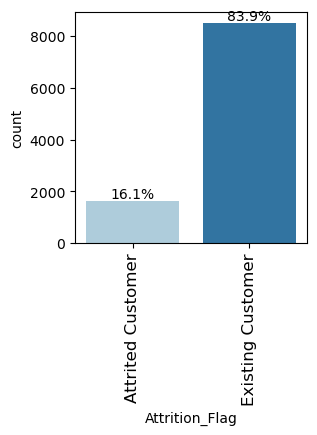

In [18]:
labeled_barplot(data, "Attrition_Flag", perc=True)

- the class distribution in the target variable is imbalanced.
- We have 84% of existing customers and 16% of Attrited customers

### Observation on Gender

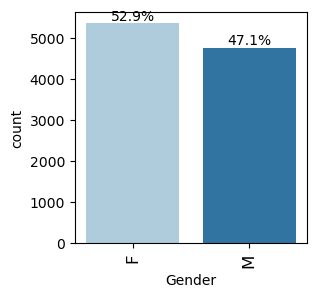

In [19]:
labeled_barplot(data, "Gender", perc=True)

* There are more male (53%) customers compared to female (47%)

### Observation on Dependent_count

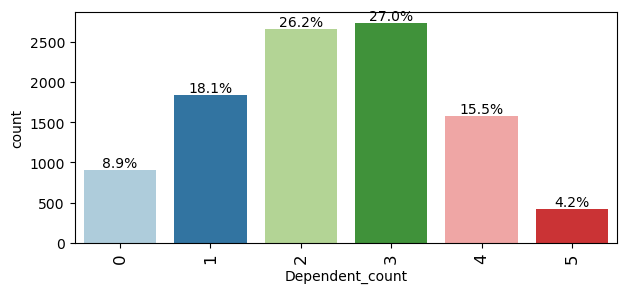

In [20]:
labeled_barplot(data, "Dependent_count", perc=True)

* Most of the credit card users have either 2 or 3 dependent. 

### Observation on Total_Relationship_Count

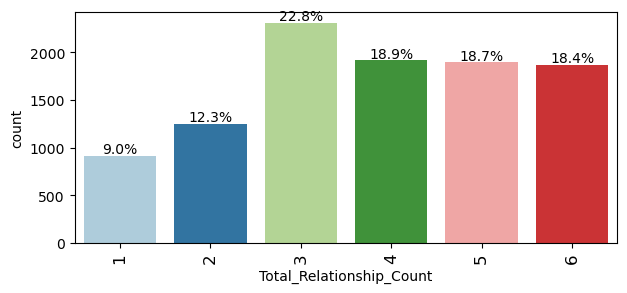

In [21]:
labeled_barplot(data, "Total_Relationship_Count", perc=True)

* Most of the customers have either 3 or more products with the bank

### Observation on Months_Inactive_12_mon

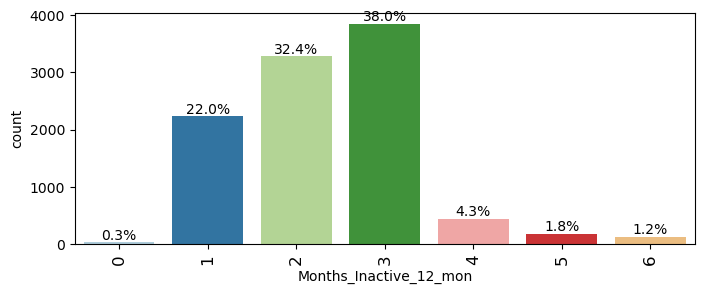

In [22]:
labeled_barplot(data, "Months_Inactive_12_mon", perc=True)

* 38% customers were inactive for 3 months, 32.4% for 2 months and 22% customers were inactive for 1 month

### Observation on Education_Level

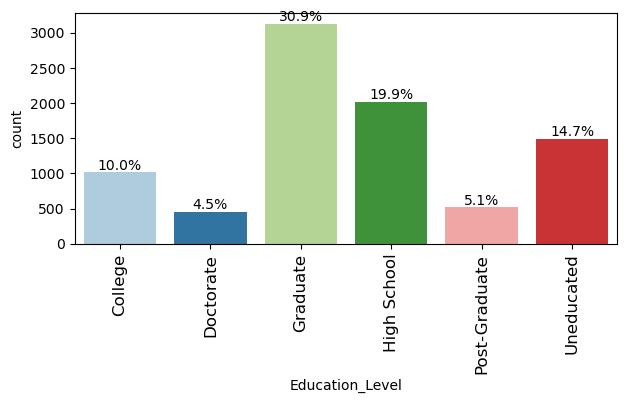

In [23]:
labeled_barplot(data, "Education_Level", perc=True)

* Almost 31% credit card users are Graduate and about 20% have completed just high school. About 15% are uneducated. Educated users like Post-Graduate and Doctorate consitute very small percentage 

### Observation on Marital_Status

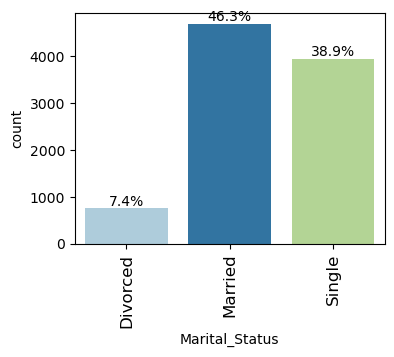

In [24]:
labeled_barplot(data, "Marital_Status", perc=True)

* Almost 46% customers are married and 39% are single

### Observation on Income_Category

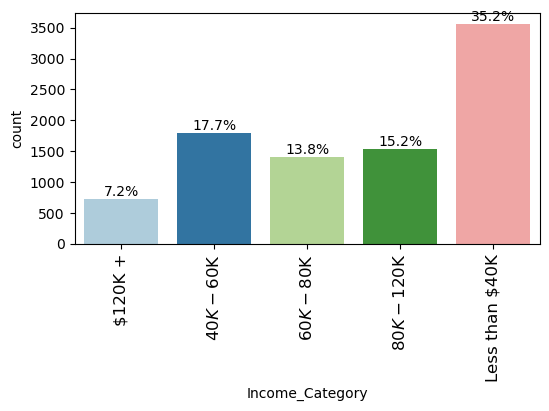

In [25]:
labeled_barplot(data, "Income_Category", perc=True)

* Almost 35% customers earn less than 40K. About 18% earn between 40K-60K, 15.2 percent earn between 80K-120K, 13.8 percent earn between 60K - 80K

### Observation on Card_Category

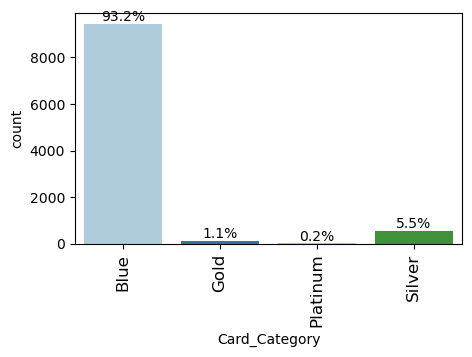

In [26]:
labeled_barplot(data, "Card_Category", perc=True)

* Almost 93.2% customers have Blue card, followed by Silver (5.5%)

### Observation on Contacts_Count_12_mon

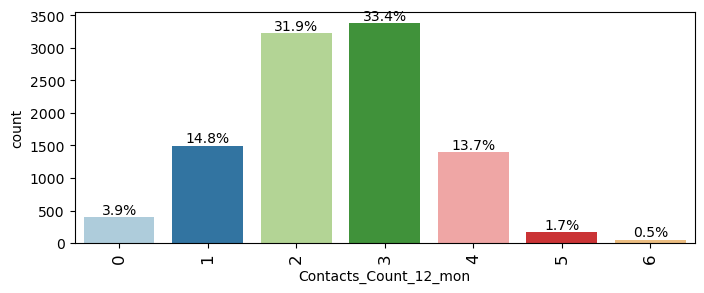

In [27]:
labeled_barplot(data, "Contacts_Count_12_mon", perc=True)

* In Majority of cases (~67%), Customer Bank contact happened 2-3 times in last 12 months

### Observation on Age

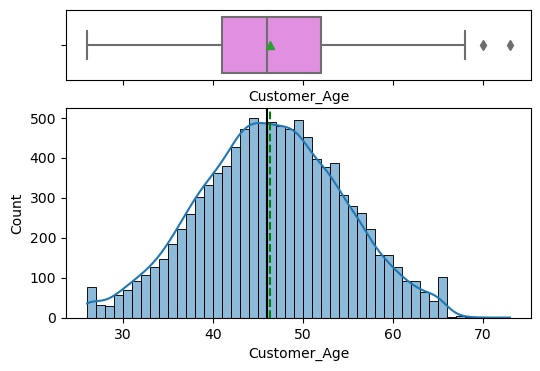

In [28]:
histogram_boxplot(data, "Customer_Age", kde=True)

* Customer Age follows normal distribution, although there are very few outlier on the higher side

### Observation on Months_on_book

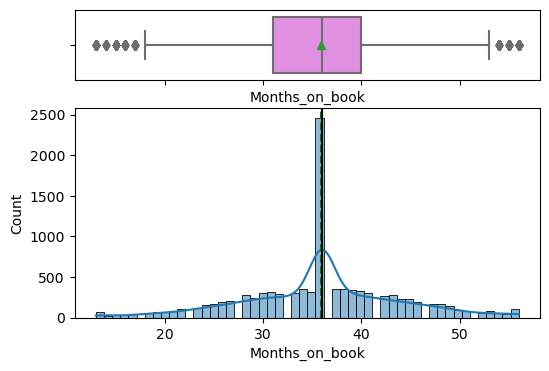

In [29]:
histogram_boxplot(data, "Months_on_book", kde=True)

* Majority of customers have been with the bank for nearly 35/36 months

### Observation on Credit_Limit

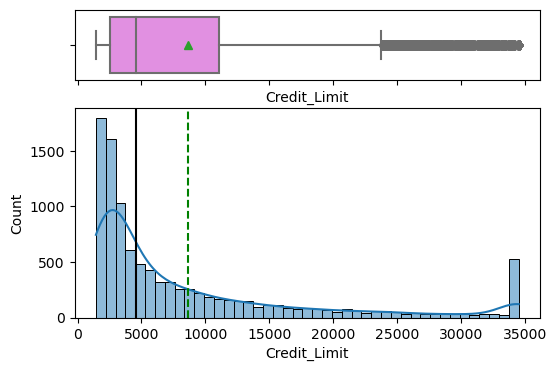

In [30]:
histogram_boxplot(data, "Credit_Limit", kde=True)

* Credit Limit data is right skewed, which may be possible as certain high income (yet to be verified) or high usage (yet to be verified) customers may have high credit limit
* There are quite few customers who have credit limit greater than 33000

### Observation on Total_Revolving_Bal

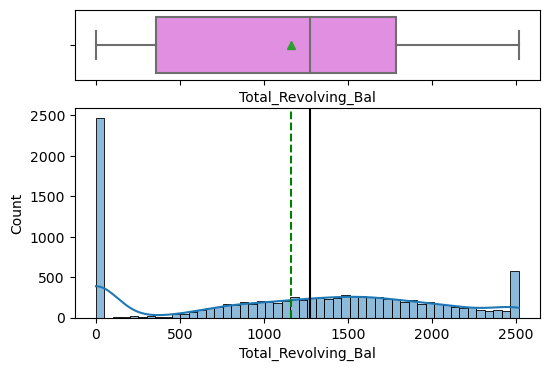

In [31]:
histogram_boxplot(data, "Total_Revolving_Bal", kde=True, bins=50)

* Most of the customers have zero revolving balance. Thre are also few customers who have revolving balance around 2500

### Observation on Avg_Open_To_Buy

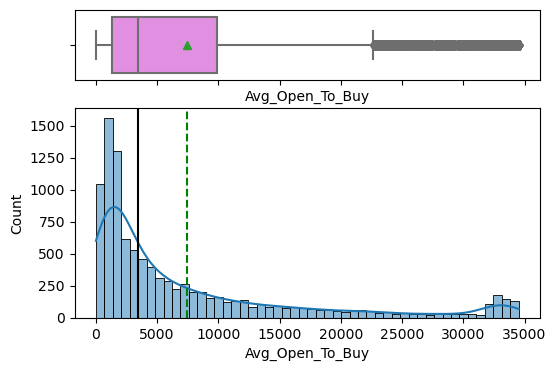

In [32]:
histogram_boxplot(data, "Avg_Open_To_Buy", kde=True, bins=50)

* Data is right skewed
* Looks like many customers with high credit limit are not utilizing their credit limit

### Observation on Total_Trans_Amt

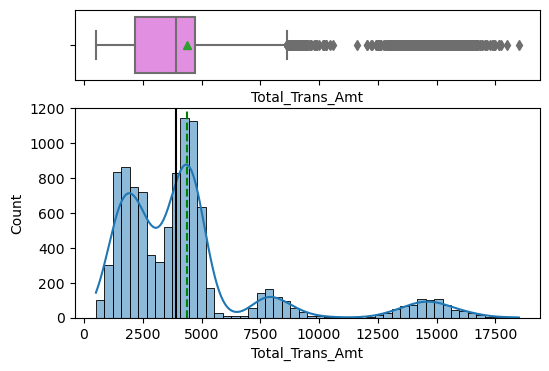

In [33]:
histogram_boxplot(data, "Total_Trans_Amt", kde=True, bins=50)

* Data is right skewed
* Most of the customers spent less than 5K during 12 months

### Observation on Total_Trans_Ct

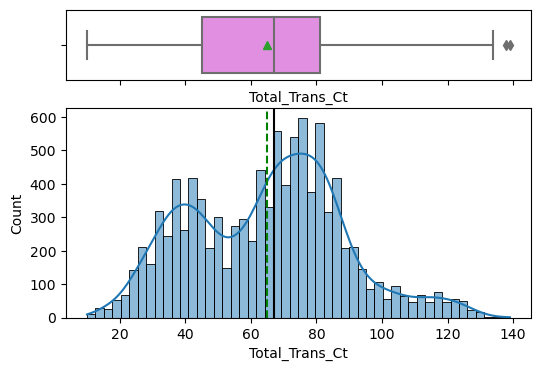

In [34]:
histogram_boxplot(data, "Total_Trans_Ct", kde=True, bins=50)

* Data has bimodal distribution, with some outliers on right side

### Observation on Total_Ct_Chng_Q4_Q1

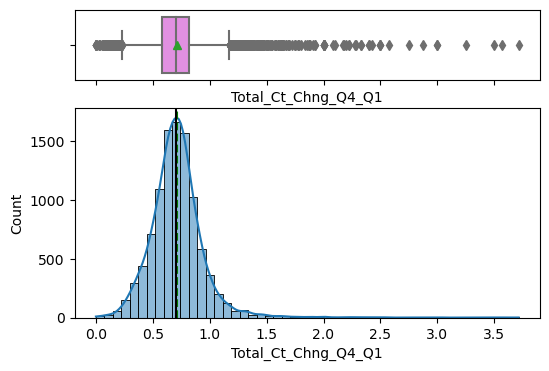

In [35]:
histogram_boxplot(data, "Total_Ct_Chng_Q4_Q1", kde=True, bins=50)

* Data is right skewed
* Q4/Q1 ratiio is less than 1 for majority of customers

### Observation on Total_Amt_Chng_Q4_Q1

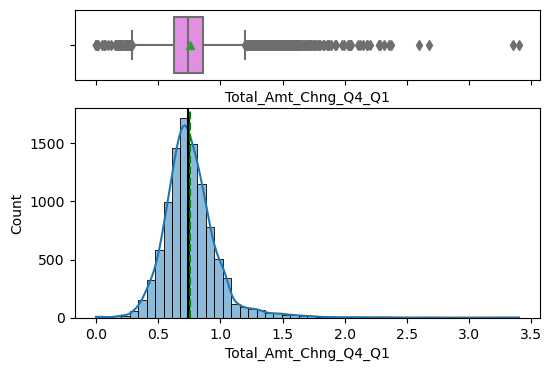

In [36]:
histogram_boxplot(data, "Total_Amt_Chng_Q4_Q1", kde=True, bins=50)

* Data is right skewed
* Q4/Q1 raio is less than 1 for majority of customers

### Observation on Avg_Utilization_Ratio

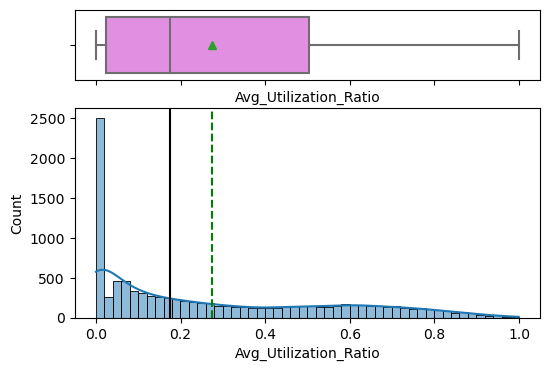

In [37]:
histogram_boxplot(data, "Avg_Utilization_Ratio", kde=True, bins=50)

* Data is right skewed with long tail

### Bivariate Analysis

In [38]:
# function to plot stacked bar chart

def stacked_barplot(data, predictor, target):
    """
    Print the category counts and plot a stacked bar chart

    data: dataframe
    predictor: independent variable
    target: target variable
    """
    count = data[predictor].nunique()
    sorter = data[target].value_counts().index[-1]
    tab1 = pd.crosstab(data[predictor], data[target], margins=True).sort_values(
        by=sorter, ascending=False
    )
    print(tab1)
    print("-" * 120)
    tab = pd.crosstab(data[predictor], data[target], normalize="index").sort_values(
        by=sorter, ascending=False
    )
    tab.plot(kind="bar", stacked=True, figsize=(count + 1, 5))
    plt.legend(
        loc="lower left",
        frameon=False,
    )
    plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
    plt.show()

Attrition_Flag  Attrited Customer  Existing Customer    All
Gender                                                     
All                          1627               8500  10127
F                             930               4428   5358
M                             697               4072   4769
------------------------------------------------------------------------------------------------------------------------


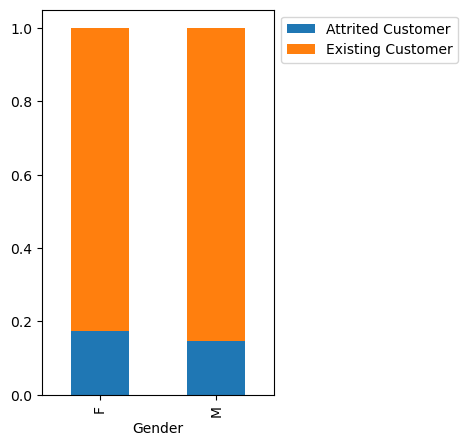

In [39]:
# Gender and Attrition Flag
stacked_barplot(data, "Gender", "Attrition_Flag")

- From the data looks like, female customer is more at Attrition risk

Attrition_Flag   Attrited Customer  Existing Customer    All
Dependent_count                                             
All                           1627               8500  10127
3                              482               2250   2732
2                              417               2238   2655
1                              269               1569   1838
4                              260               1314   1574
0                              135                769    904
5                               64                360    424
------------------------------------------------------------------------------------------------------------------------


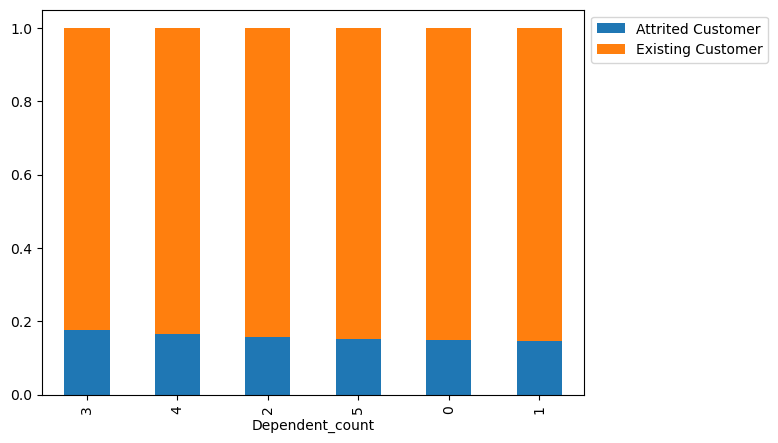

In [40]:
# Dependent_count and Attrition Flag
stacked_barplot(data, "Dependent_count", "Attrition_Flag")

- Customers with 3 and 4 dependents are more at attrition risk

Attrition_Flag   Attrited Customer  Existing Customer   All
Education_Level                                            
All                           1371               7237  8608
Graduate                       487               2641  3128
High School                    306               1707  2013
Uneducated                     237               1250  1487
College                        154                859  1013
Doctorate                       95                356   451
Post-Graduate                   92                424   516
------------------------------------------------------------------------------------------------------------------------


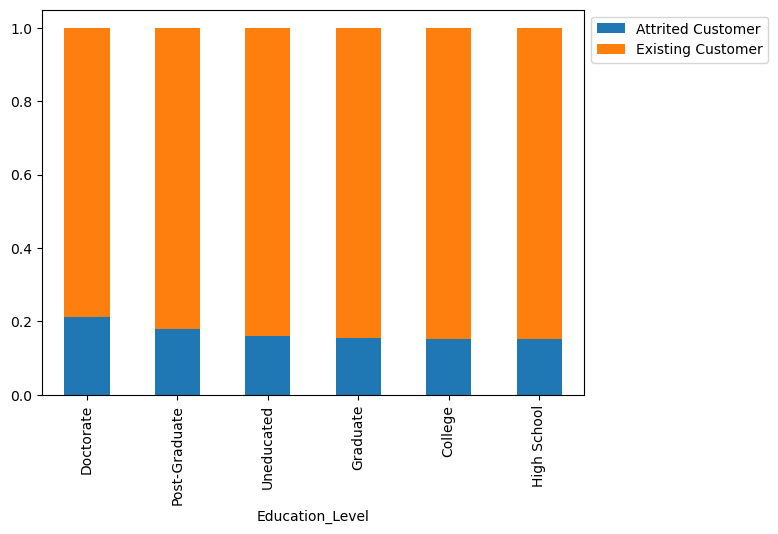

In [41]:
# Education_Level and Attrition Flag
stacked_barplot(data, "Education_Level", "Attrition_Flag")

- Customers with education level Doctorate and Post-Graduate are more at attrition risk

Attrition_Flag  Attrited Customer  Existing Customer   All
Marital_Status                                            
All                          1498               7880  9378
Married                       709               3978  4687
Single                        668               3275  3943
Divorced                      121                627   748
------------------------------------------------------------------------------------------------------------------------


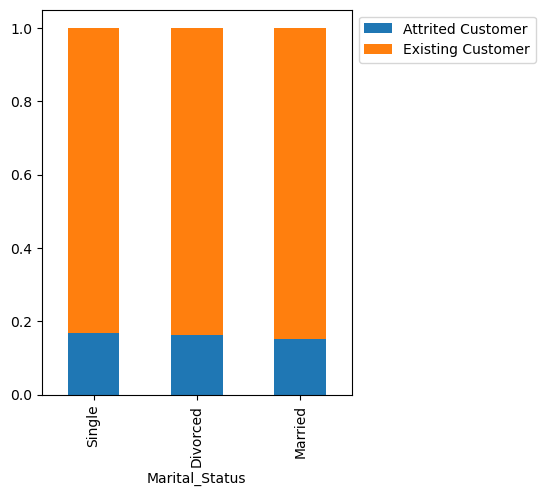

In [42]:
# Marital_Status and Attrition Flag
stacked_barplot(data, "Marital_Status", "Attrition_Flag")

- Customers who are single and Divorced are more at attrition risk

Attrition_Flag   Attrited Customer  Existing Customer   All
Income_Category                                            
All                           1440               7575  9015
Less than $40K                 612               2949  3561
$40K - $60K                    271               1519  1790
$80K - $120K                   242               1293  1535
$60K - $80K                    189               1213  1402
$120K +                        126                601   727
------------------------------------------------------------------------------------------------------------------------


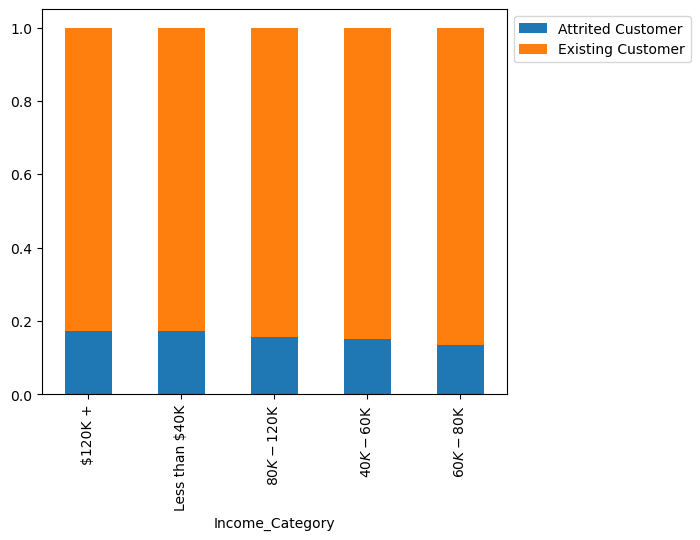

In [43]:
# Income_Category and Attrition Flag
stacked_barplot(data, "Income_Category", "Attrition_Flag")

- Customers with higher than 120K and lesser than 40K income are more at risk of attrition

Attrition_Flag  Attrited Customer  Existing Customer    All
Card_Category                                              
All                          1627               8500  10127
Blue                         1519               7917   9436
Silver                         82                473    555
Gold                           21                 95    116
Platinum                        5                 15     20
------------------------------------------------------------------------------------------------------------------------


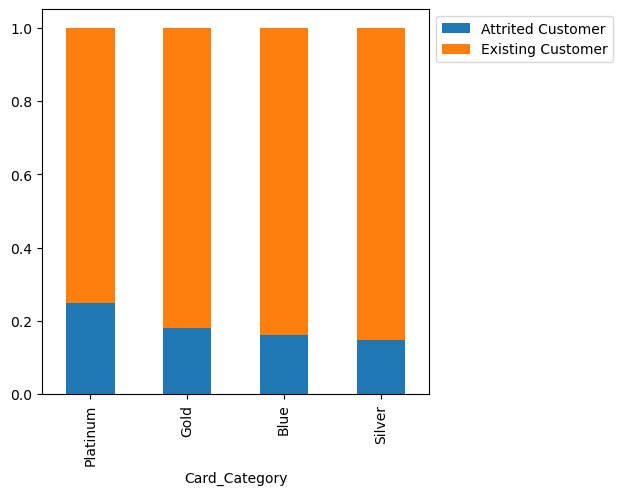

In [44]:
# Card_Category and Attrition Flag
stacked_barplot(data, "Card_Category", "Attrition_Flag")

- Customers with Platinum card are more at attrition risk

Attrition_Flag            Attrited Customer  Existing Customer    All
Total_Relationship_Count                                             
All                                    1627               8500  10127
3                                       400               1905   2305
2                                       346                897   1243
1                                       233                677    910
5                                       227               1664   1891
4                                       225               1687   1912
6                                       196               1670   1866
------------------------------------------------------------------------------------------------------------------------


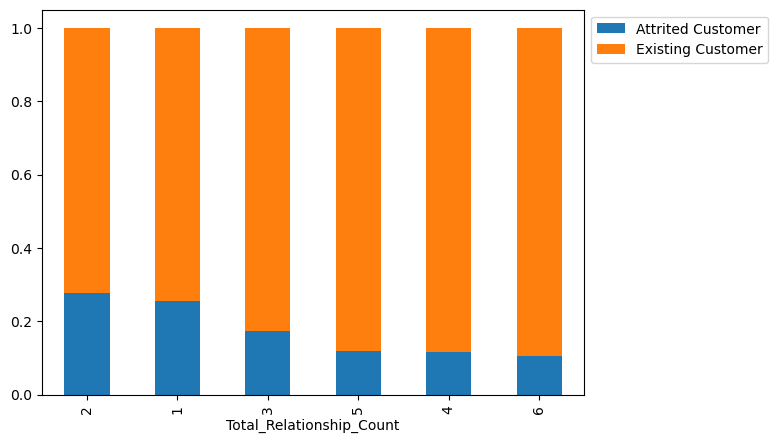

In [45]:
# Total_Relationship_Count and Attrition Flag
stacked_barplot(data, "Total_Relationship_Count", "Attrition_Flag")

- Customers with products less than 3 are more at risk of attrition

Attrition_Flag          Attrited Customer  Existing Customer    All
Months_Inactive_12_mon                                             
All                                  1627               8500  10127
3                                     826               3020   3846
2                                     505               2777   3282
4                                     130                305    435
1                                     100               2133   2233
5                                      32                146    178
6                                      19                105    124
0                                      15                 14     29
------------------------------------------------------------------------------------------------------------------------


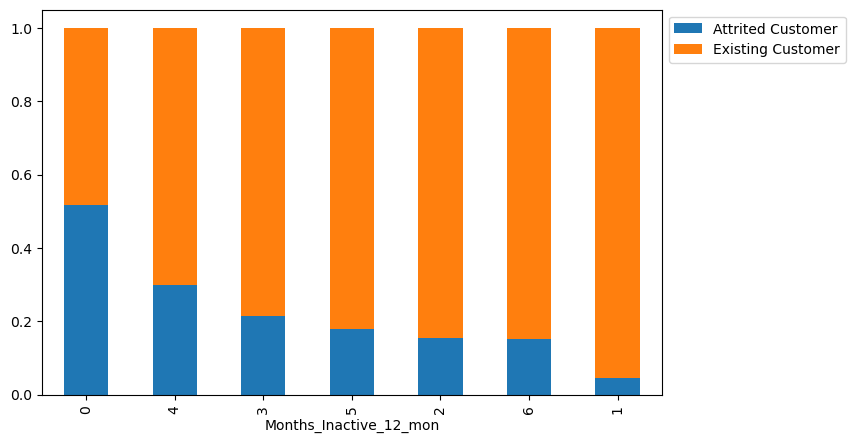

In [46]:
# Months_Inactive_12_mon and Attrition Flag
stacked_barplot(data, "Months_Inactive_12_mon", "Attrition_Flag")

- As per the data, customers with zero inactive month are most risk of attrition, followed by 4 and 3 months

Attrition_Flag         Attrited Customer  Existing Customer    All
Contacts_Count_12_mon                                             
All                                 1627               8500  10127
3                                    681               2699   3380
2                                    403               2824   3227
4                                    315               1077   1392
1                                    108               1391   1499
5                                     59                117    176
6                                     54                  0     54
0                                      7                392    399
------------------------------------------------------------------------------------------------------------------------


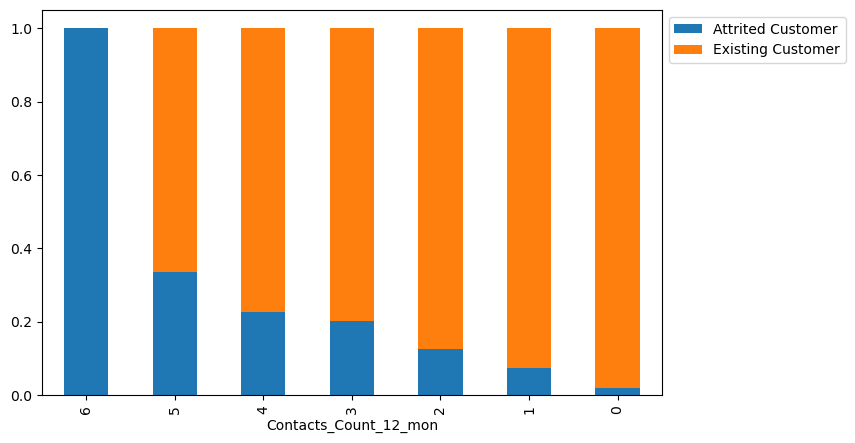

In [47]:
# Contacts_Count_12_mon and Attrition Flag
stacked_barplot(data, "Contacts_Count_12_mon", "Attrition_Flag")

- customers who have more contacts with bank are at right risk of attrition

<AxesSubplot:xlabel='Attrition_Flag', ylabel='Customer_Age'>

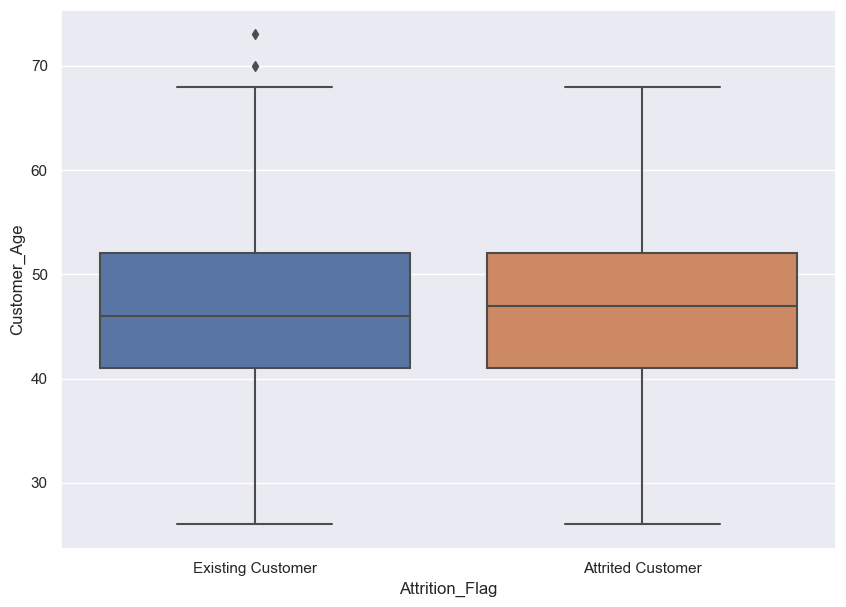

In [48]:
sns.set(rc={"figure.figsize": (10, 7)})
sns.boxplot(x="Attrition_Flag", y="Customer_Age", data=data, orient="vertical")

- Customer Age doesn't impact the attrition rate 

<AxesSubplot:xlabel='Attrition_Flag', ylabel='Months_on_book'>

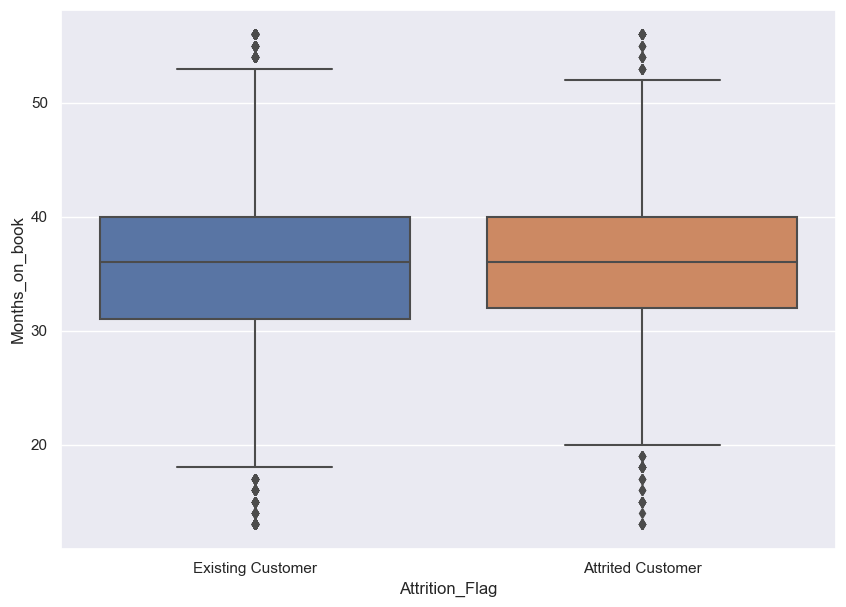

In [49]:
sns.set(rc={"figure.figsize": (10, 7)})
sns.boxplot(x="Attrition_Flag", y="Months_on_book", data=data, orient="vertical")

- Months on book doesn't seem to impact customer behavior in terms of attrition

<AxesSubplot:xlabel='Attrition_Flag', ylabel='Credit_Limit'>

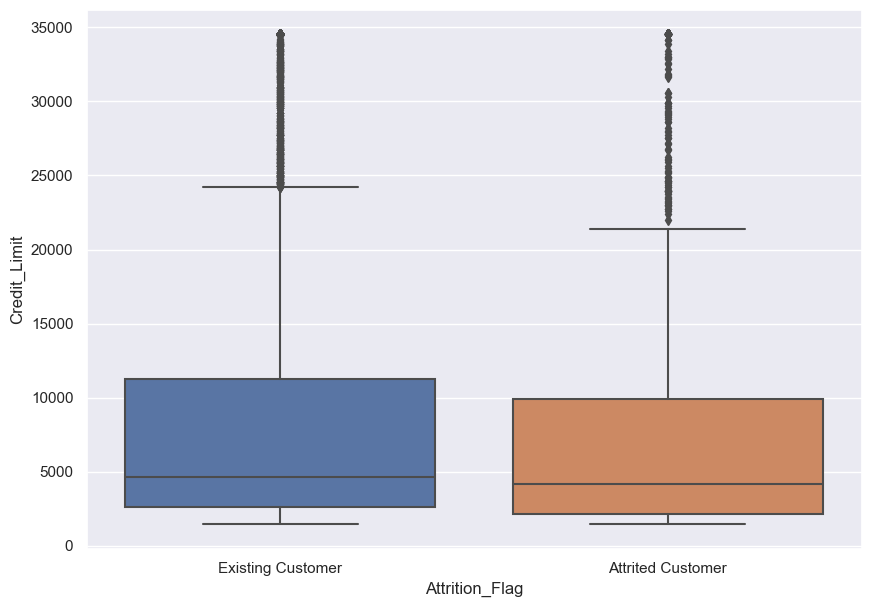

In [50]:
sns.set(rc={"figure.figsize": (10, 7)})
sns.boxplot(x="Attrition_Flag", y="Credit_Limit", data=data, orient="vertical")

- Customers with lower credit limit are at higher risk of attrition

<AxesSubplot:xlabel='Attrition_Flag', ylabel='Total_Revolving_Bal'>

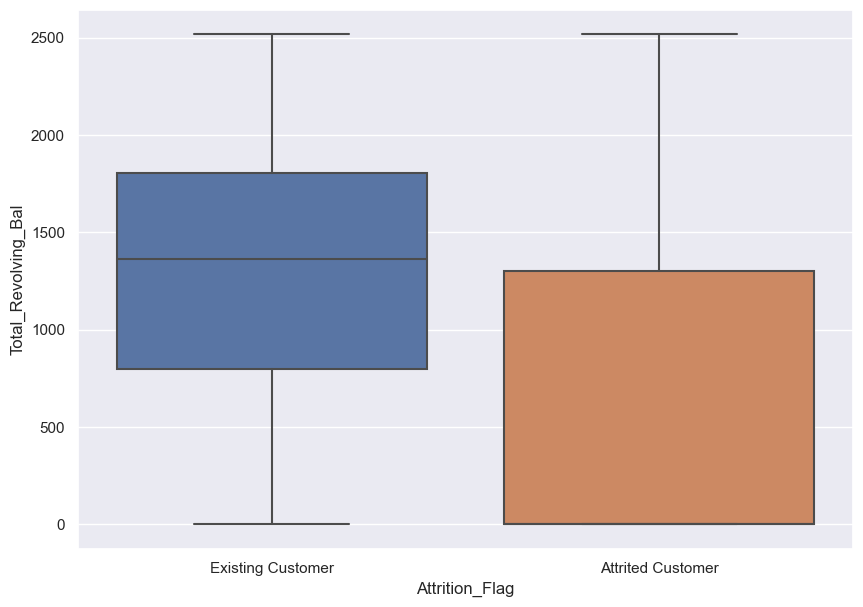

In [51]:
sns.set(rc={"figure.figsize": (10, 7)})
sns.boxplot(x="Attrition_Flag", y="Total_Revolving_Bal", data=data, orient="vertical")

- Customers with low total revolving balance are more at risk of attrition

<AxesSubplot:xlabel='Attrition_Flag', ylabel='Avg_Open_To_Buy'>

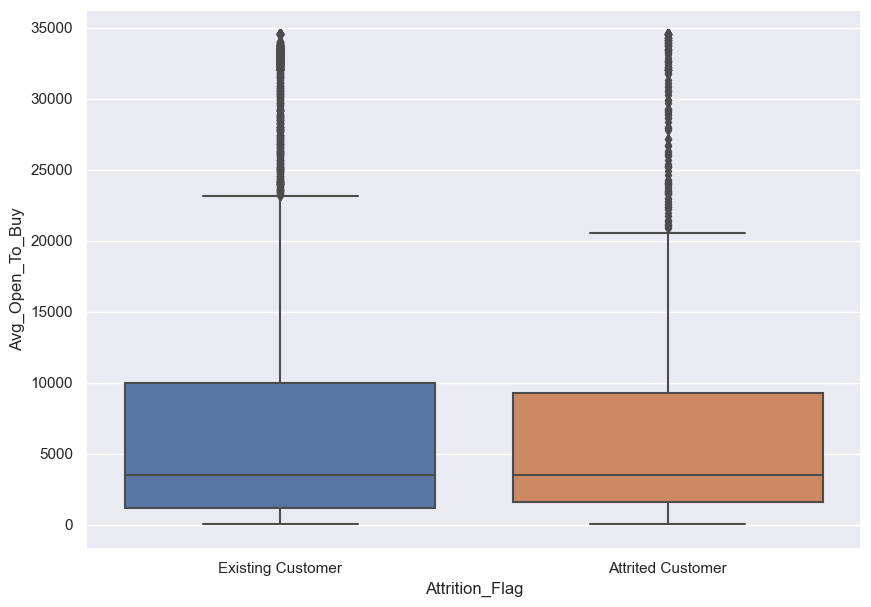

In [52]:
sns.set(rc={"figure.figsize": (10, 7)})
sns.boxplot(x="Attrition_Flag", y="Avg_Open_To_Buy", data=data, orient="vertical")

- Average Open to Buy doesn't seem to a factor in customer attrition

<AxesSubplot:xlabel='Attrition_Flag', ylabel='Total_Trans_Amt'>

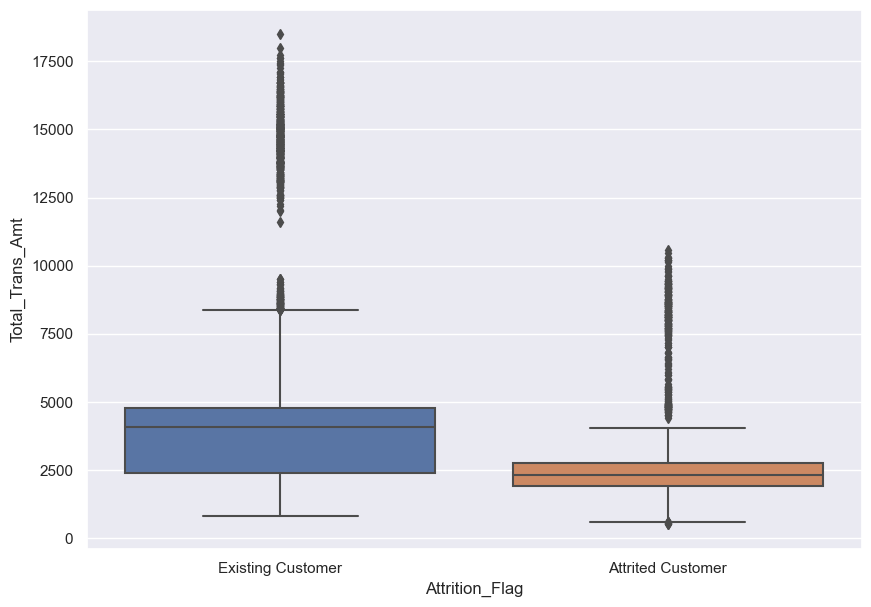

In [53]:
sns.set(rc={"figure.figsize": (10, 7)})
sns.boxplot(x="Attrition_Flag", y="Total_Trans_Amt", data=data, orient="vertical")

- Customers with lower transaction amount in last 12 months are more at risk of attrition

<AxesSubplot:xlabel='Attrition_Flag', ylabel='Total_Trans_Ct'>

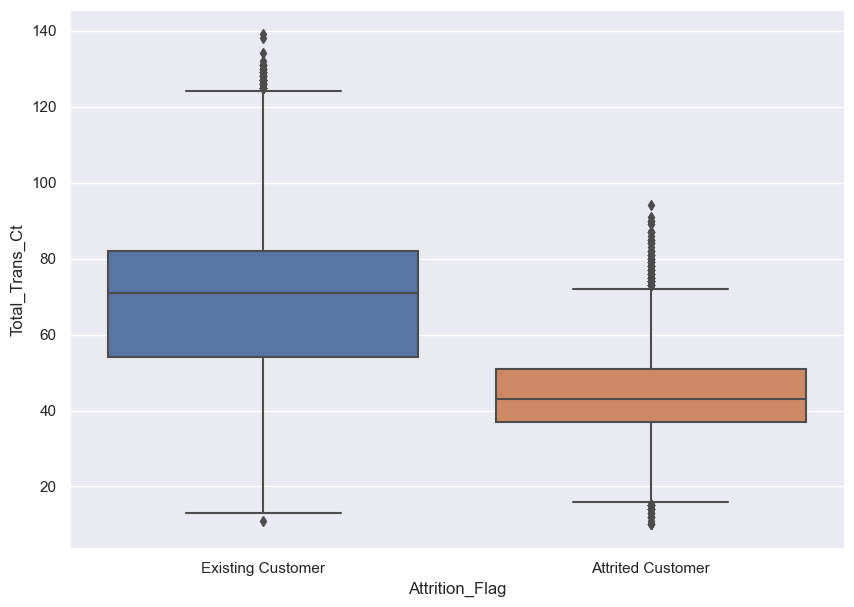

In [54]:
sns.set(rc={"figure.figsize": (10, 7)})
sns.boxplot(x="Attrition_Flag", y="Total_Trans_Ct", data=data, orient="vertical")

- Customers with lower transaction count in last 12 months are more at risk of attrition

<AxesSubplot:xlabel='Attrition_Flag', ylabel='Total_Amt_Chng_Q4_Q1'>

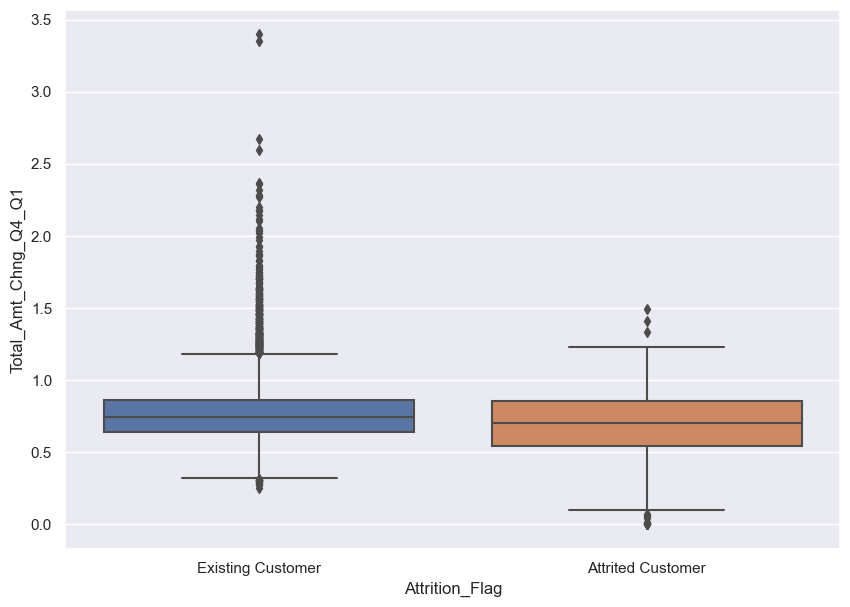

In [55]:
sns.set(rc={"figure.figsize": (10, 7)})
sns.boxplot(x="Attrition_Flag", y="Total_Amt_Chng_Q4_Q1", data=data, orient="vertical")

- Customer with lower ratio of Q4/Q1 amount is slightly higher risk of attrition

<AxesSubplot:xlabel='Attrition_Flag', ylabel='Total_Ct_Chng_Q4_Q1'>

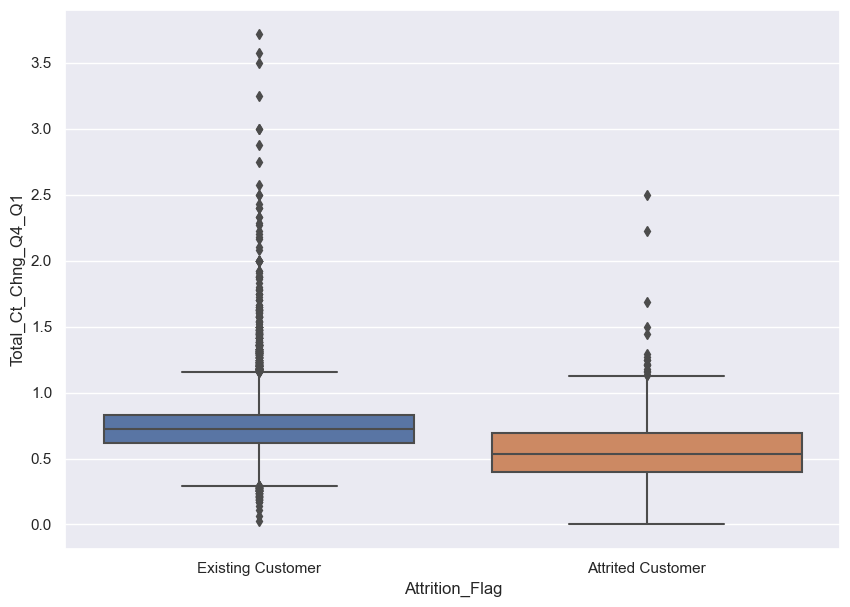

In [56]:
sns.set(rc={"figure.figsize": (10, 7)})
sns.boxplot(x="Attrition_Flag", y="Total_Ct_Chng_Q4_Q1", data=data, orient="vertical")

- Customer with lower ratio of Q4/Q1 count is slightly higher risk of attrition

<AxesSubplot:xlabel='Attrition_Flag', ylabel='Avg_Utilization_Ratio'>

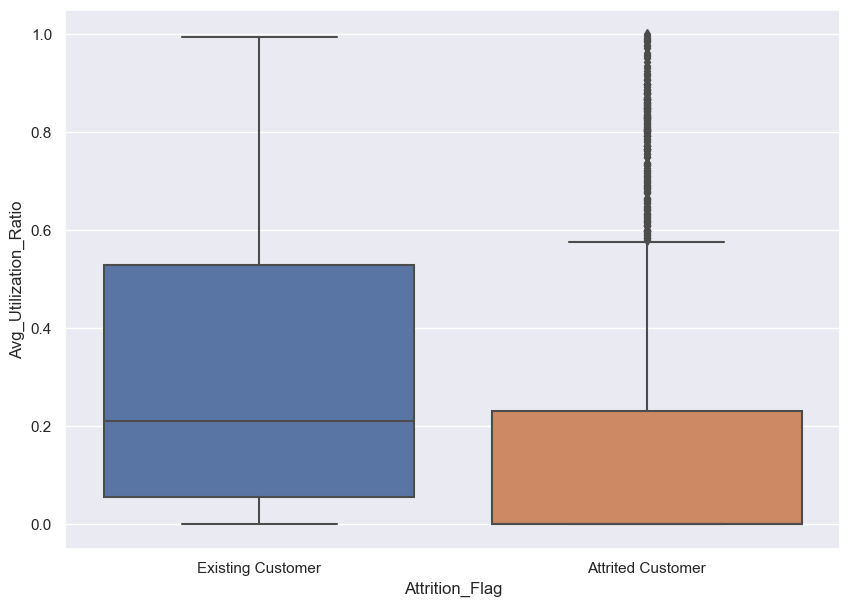

In [57]:
sns.set(rc={"figure.figsize": (10, 7)})
sns.boxplot(x="Attrition_Flag", y="Avg_Utilization_Ratio", data=data, orient="vertical")

- Customers with Lower Utilization ratio is more at risk of attrition

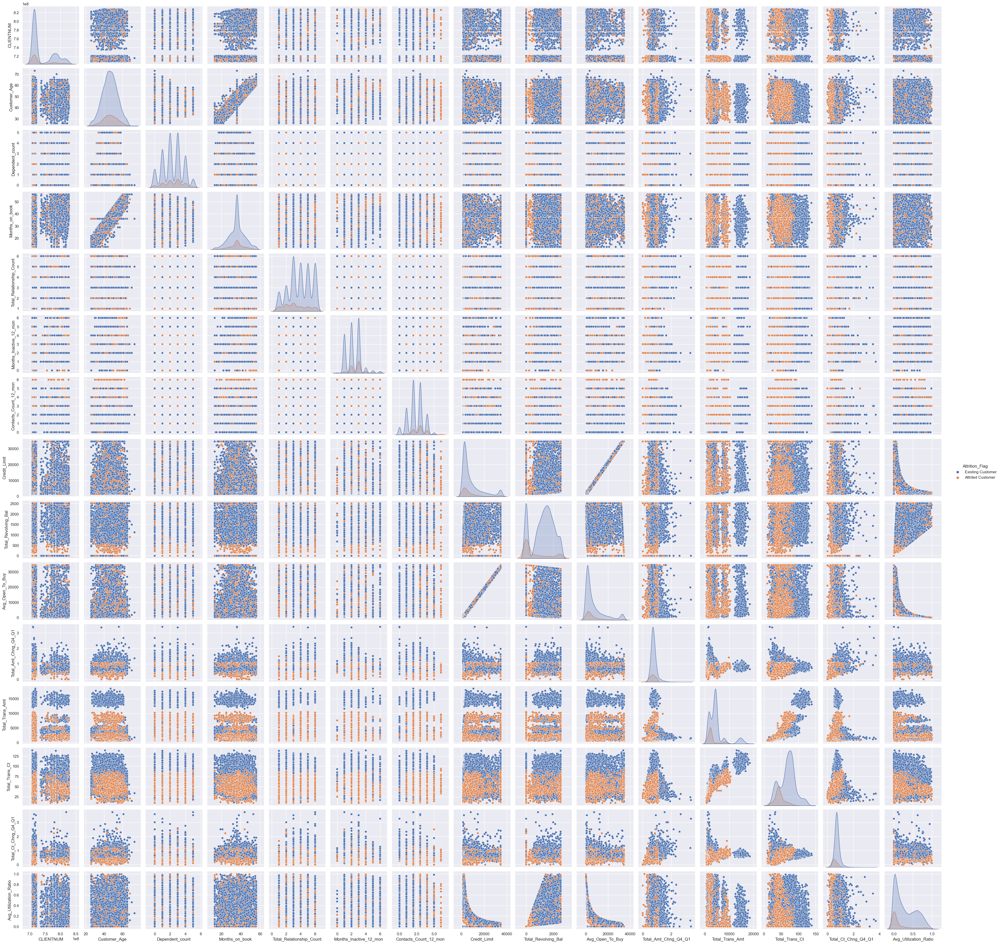

In [58]:
sns.pairplot(data, hue="Attrition_Flag")

#### Key Observations
- Customers with lower transaction count in last 12 months are more at risk of attrition
- Customers with lower transaction amount in last 12 months are more at risk of attrition
- Customer with lower ratio of Q4/Q1 count is slightly higher risk of attrition
- Customer with lower ratio of Q4/Q1 amount is slightly higher risk of attrition
- customers who have more contacts with bank are at right risk of attrition
- Higher the credit limit, lower is the average utilization ratio
- Higher the average open to buy, lower the average utilization ratio

### Data Pre-processing

In [59]:
# Dropping column - CLIENTNUM
data.drop(columns=["CLIENTNUM"], inplace=True)

In [60]:
# encoding target variable
data=data.replace({"Attrition_Flag":{"Attrited Customer":1,"Existing Customer":0}})

#### Check for outliers

In [61]:
# to find the 25th percentile and 75th percentile for the numerical columns
Q1 = data[num_cols].quantile(0.25)
Q3 = data[num_cols].quantile(0.75)

#Inter Quantile Range (75th percentile - 25th percentile)
IQR = Q3 - Q1

#Finding lower and upper bounds for all values. All values outside these bounds are outliers
lower_whisker = Q1 - 1.5*IQR
upper_whisker = Q3 + 1.5*IQR

# Percentage of outliers in each column
(((data[num_cols] < lower_whisker) | (data[num_cols] > upper_whisker)).sum()/data.shape[0]*100).sort_values(ascending=False)

Credit_Limit            9.717
Avg_Open_To_Buy         9.509
Total_Trans_Amt         8.848
Total_Amt_Chng_Q4_Q1    3.910
Total_Ct_Chng_Q4_Q1     3.891
Months_on_book          3.812
Customer_Age            0.020
Total_Trans_Ct          0.020
Total_Revolving_Bal     0.000
Avg_Utilization_Ratio   0.000
dtype: float64

Credit_Limit, Avg_Open_To_Buy and Total_Trans_Amt have outliers greater than 1.5 times IQR.

In [62]:
# check the income for the folks who have credit limit greater than 30,000

#data[data['Credit_Limit']>33000].describe(include='all').T
data[data['Credit_Limit']>33000]['Income_Category'].value_counts(1)

$80K - $120K   0.461
$120K +        0.421
$60K - $80K    0.118
Name: Income_Category, dtype: float64

- Almost 86% of customers have income greater than 80K. However 12% of customers have income in the range of 60K and 80K who have credit limit higher than 33K which doesn't seem impossible.
- We will keep the data as is, and not treat any columns for outliers

#### Split Data

In [63]:
X = data.drop(["Attrition_Flag"], axis=1)
y = data["Attrition_Flag"]

In [64]:
# Splitting data into training, validation and test sets:
# first we split data into 2 parts, say temporary and test

X_temp, X_test, y_temp, y_test = train_test_split(
    X, y, test_size=0.2, random_state=1, stratify=y
)

# then we split the temporary set into train and validation

X_train, X_val, y_train, y_val = train_test_split(
    X_temp, y_temp, test_size=0.25, random_state=1, stratify=y_temp
)
print(X_train.shape, X_val.shape, X_test.shape)

(6075, 19) (2026, 19) (2026, 19)


In [65]:
# check the target variable to see class distribution
print('** before split **')
print(y.sum()/y.shape[0])
print()
print('** after split **')
print('training data',y_train.sum()/y_train.shape[0])
print('validation data',y_val.sum()/y_val.shape[0])
print('test data',y_test.sum()/y_test.shape[0])

** before split **
0.1606596227905599

** after split **
training data 0.16065843621399176
validation data 0.16090819348469892
test data 0.16041461006910168


#### Treat Missing Values

In [66]:
# train, val and test is imputed separately by most_frequent strategy

# instantiate or create object of SimpleImputer
imp_mode = SimpleImputer(missing_values=np.nan, strategy="most_frequent")

cols_to_impute = ["Education_Level", "Income_Category","Marital_Status"]

# fit and transform the imputer on train data
X_train[cols_to_impute] = imp_mode.fit_transform(X_train[cols_to_impute])

# Transform on validation and test data
X_val[cols_to_impute] = imp_mode.transform(X_val[cols_to_impute])

# fit and transform the imputer on test data
X_test[cols_to_impute] = imp_mode.transform(X_test[cols_to_impute])

In [67]:
X_train.isna().sum()

Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64

In [68]:
X_val.isna().sum()

Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64

In [69]:
X_test.isna().sum()

Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64

#### Create dummy variable for categorical variable

In [70]:
# Creating dummy variables for categorical variables
X_train = pd.get_dummies(data=X_train, drop_first=True)
X_val = pd.get_dummies(data=X_val, drop_first=True)
X_test = pd.get_dummies(data=X_test, drop_first=True)

### Model building

#### Model evaluation criterion:

#### Model can make wrong predictions as:
1. Predicting a customer will renounce credit card but customer doesn't renounce - Loss of resources
2. Predicting a customer will not renounce credit card and the customer renounces - Loss of opportunity

#### Which case is more important? 
* Predicting that customer will not renounce credit card and the customer renounces (FN). We have to reduce such possibilities. 

#### How to reduce this loss i.e need to reduce False Negatives?
* Company wants Recall to be maximized, greater the Recall lesser the chances of false negatives.

In [71]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(("Logistic", LogisticRegression(random_state=1)))
models.append(("dtree", DecisionTreeClassifier(random_state=1)))
models.append(("Bagging", BaggingClassifier(random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1)))
models.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models.append(("GBM", GradientBoostingClassifier(random_state=1)))
models.append(("Xgboost", XGBClassifier(random_state=1, eval_metric="logloss")))

results = []  # Empty list to store all model's CV scores
names = []  # Empty list to store name of the models


# loop through all models to get the mean cross validated score
print("\n" "Cross-Validation Performance:" "\n")

for name, model in models:
    
    scoring = "recall"
    
    kfold = StratifiedKFold(
        n_splits=5, shuffle=True, random_state=1
    )  # Setting number of splits equal to 5
    
    cv_result = cross_val_score(
        estimator=model, X=X_train, y=y_train, scoring=scoring, cv=kfold
    )
    
    results.append(cv_result)
    
    names.append(name)
    
    print("{}: {}".format(name, cv_result.mean() * 100))

print("\n" "Training Performance:" "\n")

for name, model in models:
    model.fit(X_train, y_train)
    scores = recall_score(y_train, model.predict(X_train)) * 100
    print("{}: {}".format(name, scores))


Cross-Validation Performance:

Logistic: 40.46572475143903
dtree: 78.0727367870225
Bagging: 78.58451072736787
Random forest: 75.30507587650445
Adaboost: 82.16745159602303
GBM: 81.24646781789639
Xgboost: 86.78126635269493

Training Performance:

Logistic: 49.69262295081967
dtree: 100.0
Bagging: 98.5655737704918
Random forest: 100.0
Adaboost: 82.6844262295082
GBM: 87.5
Xgboost: 100.0


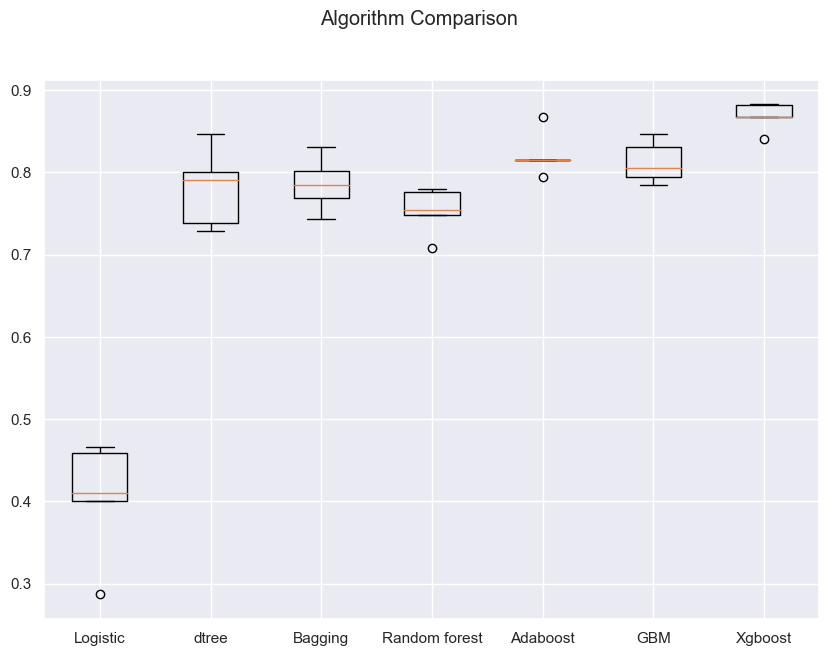

In [72]:
# Plotting boxplots for CV scores of all models defined above
fig = plt.figure()

fig.suptitle("Algorithm Comparison")
ax = fig.add_subplot(111)

plt.boxplot(results)
ax.set_xticklabels(names)

plt.show()

- We can see that XGBoost, GradientBoosting and Adaboost is giving the highest cross-validated recall

### Model building - Oversampled data

#### Oversampling train data using SMOTE

In [73]:
print("Before UpSampling, counts of label 'Yes': {}".format(sum(y_train == 1)))
print("Before UpSampling, counts of label 'No': {} \n".format(sum(y_train == 0)))

# Synthetic Minority Over Sampling Technique
sm = SMOTE(
    sampling_strategy=1, k_neighbors=5, random_state=1
)  

X_train_over, y_train_over = sm.fit_resample(X_train, y_train)


print("After UpSampling, counts of label 'Yes': {}".format(sum(y_train_over == 1)))
print("After UpSampling, counts of label 'No': {} \n".format(sum(y_train_over == 0)))


print("After UpSampling, the shape of train_X: {}".format(X_train_over.shape))
print("After UpSampling, the shape of train_y: {} \n".format(y_train_over.shape))

Before UpSampling, counts of label 'Yes': 976
Before UpSampling, counts of label 'No': 5099 

After UpSampling, counts of label 'Yes': 5099
After UpSampling, counts of label 'No': 5099 

After UpSampling, the shape of train_X: (10198, 29)
After UpSampling, the shape of train_y: (10198,) 



In [74]:
models_over = []  # Empty list to store all the models

# Appending models into the list
models_over.append(("Logistic", LogisticRegression(random_state=1)))
models_over.append(("dtree", DecisionTreeClassifier(random_state=1)))
models_over.append(("Bagging", BaggingClassifier(random_state=1)))
models_over.append(("Random forest", RandomForestClassifier(random_state=1)))
models_over.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models_over.append(("GBM", GradientBoostingClassifier(random_state=1)))
models_over.append(("Xgboost", XGBClassifier(random_state=1, eval_metric="logloss")))

results_over = []  # Empty list to store all model's CV scores
names_over = []  # Empty list to store name of the models

# loop through all models to get the mean cross validated score
print("\n" "Cross-Validation Performance - Oversampling:" "\n")

for name, model in models_over:
    
    scoring = "recall"
    
    kfold = StratifiedKFold(
        n_splits=5, shuffle=True, random_state=1
    )  # Setting number of splits equal to 5
    
    cv_result_over = cross_val_score(
        estimator=model, X=X_train_over, y=y_train_over, scoring=scoring, cv=kfold
    )
    
    results_over.append(cv_result_over)
    
    names_over.append(name)
    
    print("{}: {}".format(name, cv_result_over.mean() * 100))

print("\n" "Training Performance - Oversampling:" "\n")

for name, model in models_over:
    model.fit(X_train_over, y_train_over)
    scores_over = recall_score(y_train_over, model.predict(X_train_over)) * 100
    print("{}: {}".format(name, scores_over))


Cross-Validation Performance - Oversampling:

Logistic: 80.2519194134965
dtree: 95.23442821682157
Bagging: 96.33275606611633
Random forest: 97.97993034308915
Adaboost: 96.41109122746252
GBM: 97.13667763474379
Xgboost: 98.39179126017434

Training Performance - Oversampling:

Logistic: 84.31064914689155
dtree: 100.0
Bagging: 99.74504804863699
Random forest: 100.0
Adaboost: 96.90135320651108
GBM: 98.09766620906059
Xgboost: 100.0


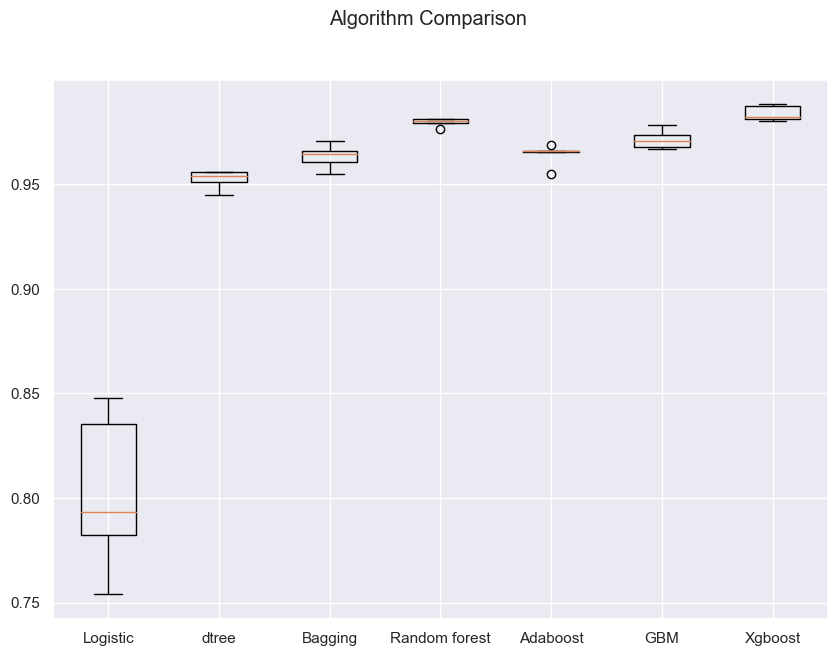

In [75]:
# Plotting boxplots for CV scores of all models defined above
fig = plt.figure()

fig.suptitle("Algorithm Comparison")
ax = fig.add_subplot(111)

plt.boxplot(results_over)
ax.set_xticklabels(names_over)

plt.show()

#### Using oversampling we see
- XGBoost, Random Forest and GBM is giving best recall score

### Model building - Undersampled data

In [76]:
print("Before Under Sampling, counts of label 'Yes': {}".format(sum(y_train == 1)))
print("Before Under Sampling, counts of label 'No': {} \n".format(sum(y_train == 0)))

rus = RandomUnderSampler(random_state=1)
X_train_un, y_train_un = rus.fit_resample(X_train, y_train)

print("After Under Sampling, counts of label 'Yes': {}".format(sum(y_train_un == 1)))
print("After Under Sampling, counts of label 'No': {} \n".format(sum(y_train_un == 0)))

print("After Under Sampling, the shape of train_X: {}".format(X_train_un.shape))
print("After Under Sampling, the shape of train_y: {} \n".format(y_train_un.shape))

Before Under Sampling, counts of label 'Yes': 976
Before Under Sampling, counts of label 'No': 5099 

After Under Sampling, counts of label 'Yes': 976
After Under Sampling, counts of label 'No': 976 

After Under Sampling, the shape of train_X: (1952, 29)
After Under Sampling, the shape of train_y: (1952,) 



In [77]:
models_un = []  # Empty list to store all the models

# Appending models into the list
models_un.append(("Logistic", LogisticRegression(random_state=1)))
models_un.append(("dtree", DecisionTreeClassifier(random_state=1)))
models_un.append(("Bagging", BaggingClassifier(random_state=1)))
models_un.append(("Random forest", RandomForestClassifier(random_state=1)))
models_un.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models_un.append(("GBM", GradientBoostingClassifier(random_state=1)))
models_un.append(("Xgboost", XGBClassifier(random_state=1, eval_metric="logloss")))

results_un = []  # Empty list to store all model's CV scores
names_un = []  # Empty list to store name of the models

# loop through all models to get the mean cross validated score
print("\n" "Cross-Validation Performance - Undersampling:" "\n")

for name, model in models_over:
    
    scoring = "recall"
    
    kfold = StratifiedKFold(
        n_splits=5, shuffle=True, random_state=1
    )  # Setting number of splits equal to 5
    
    cv_result_un = cross_val_score(
        estimator=model, X=X_train_un, y=y_train_un, scoring=scoring, cv=kfold
    )
    
    results_un.append(cv_result_un)
    
    names_un.append(name)
    
    print("{}: {}".format(name, cv_result_un.mean() * 100))

print("\n" "Training Performance - Undersampling:" "\n")

for name, model in models_un:
    model.fit(X_train_un, y_train_un)
    scores_un = recall_score(y_train_un, model.predict(X_train_un)) * 100
    print("{}: {}".format(name, scores_un))


Cross-Validation Performance - Undersampling:

Logistic: 80.63474620617477
dtree: 88.93458922030352
Bagging: 90.98430141287285
Random forest: 93.0334903192046
Adaboost: 93.13762428048143
GBM: 94.36473050758765
Xgboost: 95.28833071690215

Training Performance - Undersampling:

Logistic: 81.76229508196722
dtree: 100.0
Bagging: 99.07786885245902
Random forest: 100.0
Adaboost: 95.28688524590164
GBM: 98.05327868852459
Xgboost: 100.0


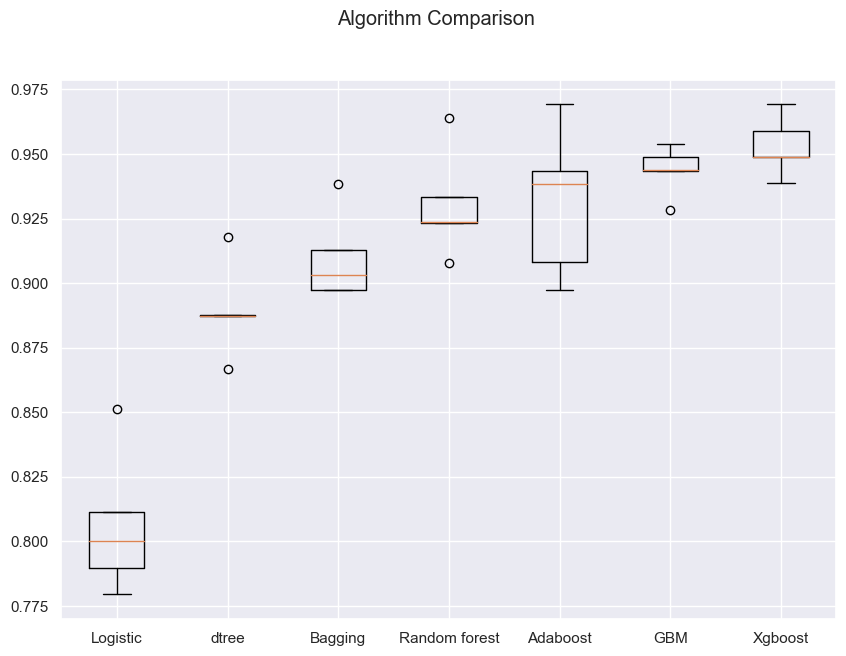

In [78]:
# Plotting boxplots for CV scores of all models defined above
fig = plt.figure()

fig.suptitle("Algorithm Comparison")
ax = fig.add_subplot(111)

plt.boxplot(results_un)
ax.set_xticklabels(names_un)

plt.show()

#### Using undersampling we see
XGBoost, Adaboost and GBM is giving best recall score

### Hyperparameter tuning using random search

Choosing Adaboost, GBM and XGBoost for tuning based on the recall scores from previous cross validation steps 

Creating functions to calculate different metrics and confusion matrix

In [79]:
# defining a function to compute different metrics to check performance of a classification model built using sklearn
def model_performance_classification_sklearn(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "Accuracy": acc,
            "Recall": recall,
            "Precision": precision,
            "F1": f1,
        },
        index=[0],
    )

    return df_perf

In [80]:
def confusion_matrix_sklearn(model, predictors, target):
    """
    To plot the confusion_matrix with percentages

    model: classifier
    predictors: independent variables
    target: dependent variable
    """
    y_pred = model.predict(predictors)
    cm = confusion_matrix(target, y_pred)
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()
        ]
    ).reshape(2, 2)

    plt.figure(figsize=(4, 3))
    sns.heatmap(cm, annot=labels, fmt="")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

### Adaboosting
#### RandomizedSearchCV

In [81]:
# defining model
abc = AdaBoostClassifier(random_state=1)

# Parameter grid to pass in RandomizedSearchCV

param_grid = {
    "n_estimators": np.arange(10, 110, 10),
    "learning_rate": [0.1, 0.01, 0.2, 0.05, 1],
    "base_estimator": [
        DecisionTreeClassifier(max_depth=1, random_state=1,class_weight='balanced'),
        DecisionTreeClassifier(max_depth=2, random_state=1,class_weight='balanced'),
        DecisionTreeClassifier(max_depth=3, random_state=1,class_weight='balanced'),
    ],
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=abc,
                                   param_distributions=param_grid,
                                   n_jobs = -1,
                                   n_iter=50,
                                   scoring=scorer,
                                   cv=5,
                                   random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train,y_train)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

Best parameters are {'n_estimators': 50, 'learning_rate': 0.1, 'base_estimator': DecisionTreeClassifier(class_weight='balanced', max_depth=2, random_state=1)} with CV score=0.9395238095238095:


In [82]:
# building model with best parameters
adc_tuned = AdaBoostClassifier(
    n_estimators=50,
    learning_rate=0.1,
    random_state=1,
    base_estimator=DecisionTreeClassifier(max_depth=2, random_state=1,class_weight='balanced'),
)

# Fit the model on training data
adc_tuned.fit(X_train, y_train)

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(class_weight='balanced',
                                                         max_depth=2,
                                                         random_state=1),
                   learning_rate=0.1, random_state=1)

Adaboost tuned Training performance:
   Accuracy  Recall  Precision    F1
0     0.918   0.961      0.670 0.790
*************************************


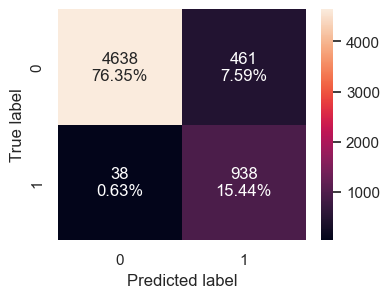

In [83]:
# Calculating different metrics on train set
Adaboost_train_tuned = model_performance_classification_sklearn(
    adc_tuned, X_train, y_train
)
print("Adaboost tuned Training performance:")
print(Adaboost_train_tuned)
print("*************************************")
# creating confusion matrix
confusion_matrix_sklearn(adc_tuned, X_train, y_train)

Adaboost tuned Validation performance:
   Accuracy  Recall  Precision    F1
0     0.924   0.945      0.695 0.801
*************************************


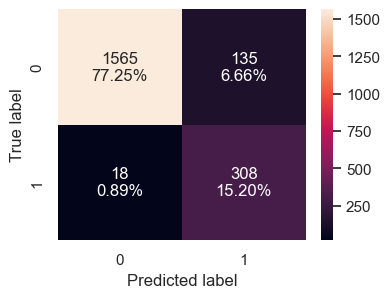

In [84]:
# Calculating different metrics on validation set
Adaboost_val_tuned = model_performance_classification_sklearn(
    adc_tuned, X_val, y_val
)
print("Adaboost tuned Validation performance:")
print(Adaboost_val_tuned)
print("*************************************")
# creating confusion matrix
confusion_matrix_sklearn(adc_tuned, X_val, y_val)

- There is not much variation between training recall and validation recall. 

### Gradient Boosting
#### RandomizedSearchCV

In [85]:
# defining model
gbc = GradientBoostingClassifier(random_state=1)

# Parameter grid to pass in RandomizedSearchCV

param_grid = {
    "n_estimators": np.arange(10, 110, 10),
    "subsample":[0.8,0.9,1],
    "learning_rate": [0.1, 0.01, 0.2, 0.05, 1],
    "max_features":[0.7,0.8,0.9,1],
    "max_depth":[1,2,3],
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_gbc_cv = RandomizedSearchCV(estimator=gbc,
                                   param_distributions=param_grid,
                                   n_jobs = -1,
                                   n_iter=50,
                                   scoring=scorer,
                                   cv=5,
                                   random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_gbc_cv.fit(X_train,y_train)

print("Best parameters are {} with CV score={}:" .format(randomized_gbc_cv.best_params_,randomized_gbc_cv.best_score_))

Best parameters are {'subsample': 0.9, 'n_estimators': 100, 'max_features': 0.9, 'max_depth': 3, 'learning_rate': 0.2} with CV score=0.8534484563055992:


In [86]:
# building model with best parameters
gbc_tuned = GradientBoostingClassifier(
    random_state=1, 
    n_estimators=100,
    max_features=0.9,
    max_depth=3,
    subsample=0.9,
    learning_rate=0.2,
)

# Fit the model on training data
gbc_tuned.fit(X_train, y_train)

GradientBoostingClassifier(learning_rate=0.2, max_features=0.9, random_state=1,
                           subsample=0.9)

GBC tuned Training performance:
   Accuracy  Recall  Precision    F1
0     0.987   0.944      0.974 0.958
*************************************


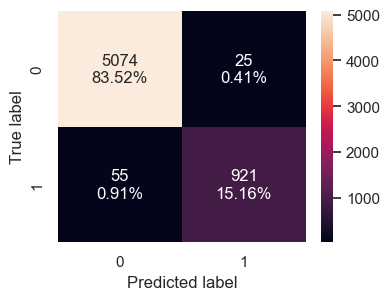

In [87]:
# Calculating different metrics on train set
gbc_train_tuned = model_performance_classification_sklearn(
    gbc_tuned, X_train, y_train
)
print("GBC tuned Training performance:")
print(gbc_train_tuned)
print("*************************************")
# creating confusion matrix
confusion_matrix_sklearn(gbc_tuned, X_train, y_train)

gbc tuned Validation performance:
   Accuracy  Recall  Precision    F1
0     0.971   0.883      0.932 0.907
*************************************


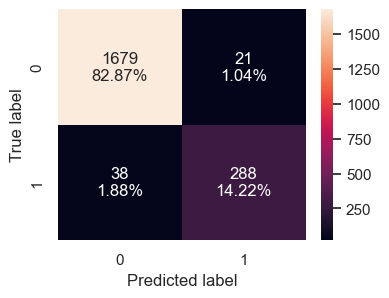

In [88]:
# Calculating different metrics on validation set
gbc_val_tuned = model_performance_classification_sklearn(
    gbc_tuned, X_val, y_val
)
print("gbc tuned Validation performance:")
print(gbc_val_tuned)
print("*************************************")
# creating confusion matrix
confusion_matrix_sklearn(gbc_tuned, X_val, y_val)

- For Gradient boosting, recall for validation has dropped

### XGBoost
#### RandomizedSearchCV

In [89]:
# defining model
xgb = XGBClassifier(random_state=1,eval_metric='logloss')

# Parameter grid to pass in RandomizedSearchCV
param_grid={'n_estimators':np.arange(50,150,50),
            'scale_pos_weight':[2,5,10],
            'learning_rate':[0.01,0.1,0.2,0.05],
            'gamma':[0,1,3,5],
            'subsample':[0.8,0.9,1],
            'max_depth':np.arange(1,5,1),
            'reg_lambda':[5,10]}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_xgb_cv = RandomizedSearchCV(estimator=xgb,
                                       param_distributions=param_grid,
                                       n_iter=50,
                                       scoring=scorer,
                                       cv=5,
                                       random_state=1,
                                       n_jobs = -1)

#Fitting parameters in RandomizedSearchCV
randomized_xgb_cv.fit(X_train,y_train)

print("Best parameters are {} with CV score={}:" .format(randomized_xgb_cv.best_params_,randomized_xgb_cv.best_score_))

Best parameters are {'subsample': 0.8, 'scale_pos_weight': 10, 'reg_lambda': 10, 'n_estimators': 50, 'max_depth': 2, 'learning_rate': 0.1, 'gamma': 0} with CV score=0.9682260596546313:


In [90]:
# building model with best parameters
xgb_tuned = XGBClassifier(
    random_state=1,
    n_estimators=50,
    scale_pos_weight=10,
    gamma=0,
    subsample=0.8,
    learning_rate=0.1,
    eval_metric="logloss",
    max_depth=2,
    reg_lambda=10,
)
# Fit the model on training data
xgb_tuned.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=0, gpu_id=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.1, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=2,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, n_estimators=50, n_jobs=None,
              num_parallel_tree=None, predictor=None, random_state=1, ...)

XGB tuned Training performance:
   Accuracy  Recall  Precision    F1
0     0.849   0.984      0.516 0.677
*************************************


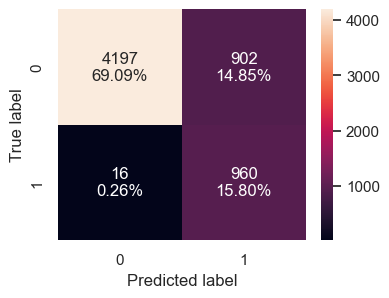

In [91]:
# Calculating different metrics on train set
xgb_train_tuned = model_performance_classification_sklearn(
    xgb_tuned, X_train, y_train
)
print("XGB tuned Training performance:")
print(xgb_train_tuned)
print("*************************************")
# creating confusion matrix
confusion_matrix_sklearn(xgb_tuned, X_train, y_train)

XGB tuned Validation performance:
   Accuracy  Recall  Precision    F1
0     0.846   0.966      0.512 0.670
*************************************


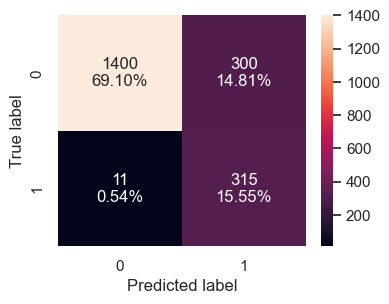

In [92]:
# Calculating different metrics on validation set
xgb_val_tuned = model_performance_classification_sklearn(
    xgb_tuned, X_val, y_val
)
print("XGB tuned Validation performance:")
print(xgb_val_tuned)
print("*************************************")
# creating confusion matrix
confusion_matrix_sklearn(xgb_tuned, X_val, y_val)

- Recall has not dropped much from training to validation set
- XGB gives best recall score for validation data

### Model Performances

In [93]:
# training performance comparison

models_train_comp_df = pd.concat(
    [
        Adaboost_train_tuned.T,
        gbc_train_tuned.T,
        xgb_train_tuned.T,
    ],
    axis=1,
)
models_train_comp_df.columns = [
    "Adaboost Tuned Random Search",
    "Gradient Boost Tuned Random Search",
    "Xgboost Tuned with Random search",
]
print("Training performance comparison:")
models_train_comp_df.T

Training performance comparison:


,Accuracy,Recall,Precision,F1
Adaboost Tuned Random Search,0.918,0.961,0.670,0.790
Gradient Boost Tuned Random Search,0.987,0.944,0.974,0.958
Xgboost Tuned with Random search,0.849,0.984,0.516,0.677


In [94]:
# Validation performance comparison

models_val_comp_df = pd.concat(
    [
        Adaboost_val_tuned.T,
        gbc_val_tuned.T,
        xgb_val_tuned.T,
    ],
    axis=1,
)
models_val_comp_df.columns = [
    "Adaboost Tuned Random Search",
    "Gradient Boost Tuned Random Search",
    "Xgboost Tuned with Random search",
]
print("Validation performance comparison:")
models_val_comp_df.T

Validation performance comparison:


,Accuracy,Recall,Precision,F1
Adaboost Tuned Random Search,0.924,0.945,0.695,0.801
Gradient Boost Tuned Random Search,0.971,0.883,0.932,0.907
Xgboost Tuned with Random search,0.846,0.966,0.512,0.670


#### Comparing all 3 tuned modules
- XGBoost gives best recall score for both validation set and training set, followed by Adaboost

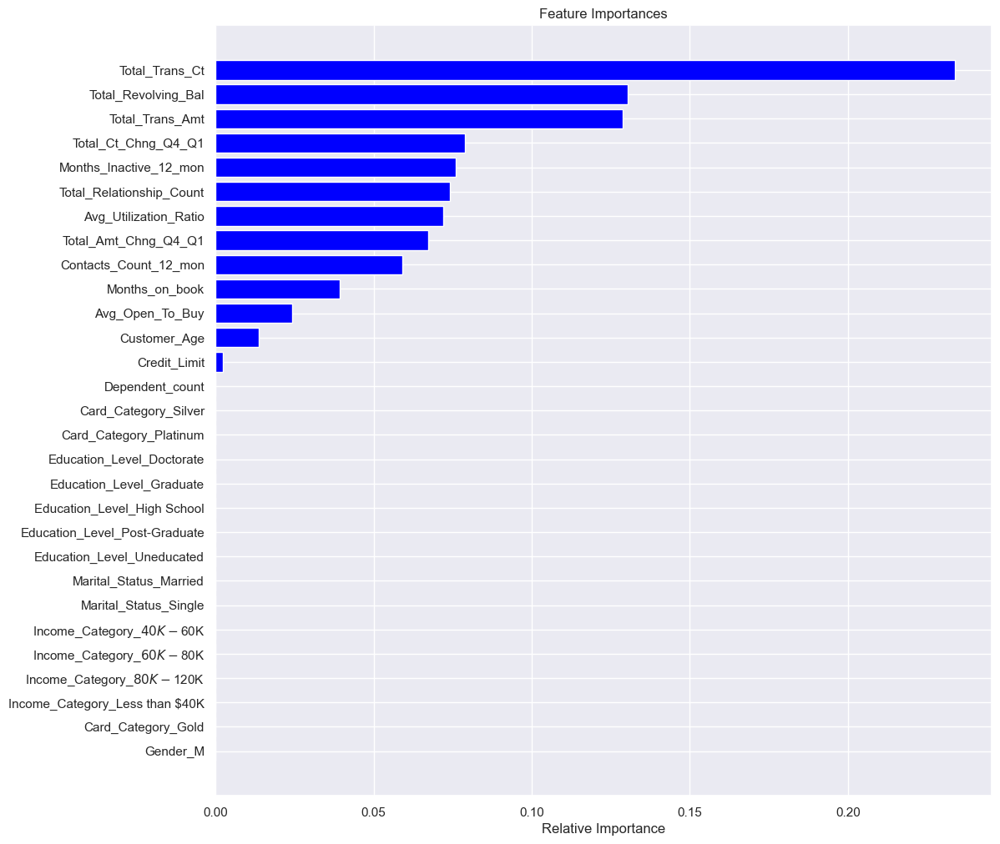

In [95]:
feature_names = X_train.columns
importances = xgb_tuned.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12, 12))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="blue", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

Top 3 performing features based on XGBoost
* Total_Trans_Ct
* Total_Revolving_Bal
* Total_Trans_Amt

### Productionize the model
- Create a final model using pipelines

In [96]:
# creating a list of numerical variables
numerical_features = ["Customer_Age", "Months_on_book", "Credit_Limit","Total_Revolving_Bal","Avg_Open_To_Buy","Total_Trans_Amt",
                     "Total_Trans_Ct","Total_Ct_Chng_Q4_Q1","Total_Amt_Chng_Q4_Q1","Avg_Utilization_Ratio"]

# creating a transformer for numerical variables, which will apply simple imputer on the numerical variables
numeric_transformer = Pipeline(steps=[("imputer", SimpleImputer(strategy="median"))])

# creating a list of categorical variables

categorical_features = [
    "Gender",
    "Dependent_count",
    "Education_Level",
    "Marital_Status",
    "Income_Category",
    "Card_Category",
    "Total_Relationship_Count",
    "Months_Inactive_12_mon",
    "Contacts_Count_12_mon",
]    

# creating a transformer for categorical variables, which will first apply simple imputer and
# then do one hot encoding for categorical variables
categorical_transformer = Pipeline(
    steps=[
        ("imputer", SimpleImputer(strategy="most_frequent")),
        ("onehot", OneHotEncoder(handle_unknown="ignore")),
    ]
)

# handle_unknown = "ignore", allows model to handle any unknown category in the test data

# combining categorical transformer and numerical transformer using a column transformer

preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_transformer, numerical_features),
        ("cat", categorical_transformer, categorical_features),
    ],
    remainder="passthrough",
)
# remainder = "passthrough" has been used, it will allow variables that are present in original data
# but not in "numerical_columns" and "categorical_columns" to pass through the column transformer without any changes

In [97]:
# Separating target variable and other variables
X = data.drop("Attrition_Flag", axis=1)
Y = data["Attrition_Flag"]

- Now we already know the best model we need to process with, so we don't need to divide data into 3 parts

In [98]:
# Splitting the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X, Y, test_size=0.30, random_state=1, stratify=Y
)
print(X_train.shape, X_test.shape)

(7088, 19) (3039, 19)


In [99]:
# Creating new pipeline with best parameters
model = Pipeline(
    steps=[
        ("pre", preprocessor),
        (
            "XGB",
            XGBClassifier(
                random_state=1,
                n_estimators=50,
                scale_pos_weight=10,
                subsample=0.8,
                learning_rate=0.1,
                gamma=0,
                eval_metric="logloss",
                reg_lambda=10,
                max_depth=2,
            ),
        ),
    ]
)
# Fit the model on training data
model.fit(X_train, y_train)

Pipeline(steps=[('pre',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median'))]),
                                                  ['Customer_Age',
                                                   'Months_on_book',
                                                   'Credit_Limit',
                                                   'Total_Revolving_Bal',
                                                   'Avg_Open_To_Buy',
                                                   'Total_Trans_Amt',
                                                   'Total_Trans_Ct',
                                                   'Total_Ct_Chng_Q4_Q1',
                                                   'Total_Amt_Chng_Q4_Q1',
                                                   'Avg_Utilization_Ratio']),
                                                 ('cat',...
                               feature_types=None, gamma=0, gpu_id=None,
                               grow_policy=None, importance_type=None,
                               interaction_constraints=None, learning_rate=0.1,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=2, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, n_estimators=50,
                               n_jobs=None, num_parallel_tree=None,
                               predictor=None, random_state=1, ...))])

In [100]:
model_performance_classification_sklearn(model, X_train, y_train)

,Accuracy,Recall,Precision,F1
0,0.847,0.980,0.512,0.673


In [101]:
model_performance_classification_sklearn(model, X_test, y_test)

,Accuracy,Recall,Precision,F1
0,0.836,0.982,0.494,0.658


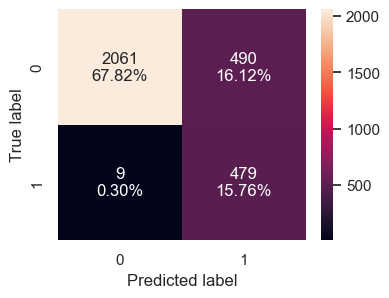

In [102]:
confusion_matrix_sklearn(model, X_test, y_test)

### Actionable Insights & Recommendations

- XGBoost gave best recall, but precision dropped
- Female customer is more at Attrition risk, bank should focus on female customers
- Customers with 3 and 4 dependents are more at attrition risk, Bank should focus on them
- Bank should focus on customers with education level Doctorate and Post-Graduate as they are at higher risk of attrition
- Bank should focus on Single and Divorced customers
- Customers with higher than 120K and lesser than 40K income are more at risk of attrition, Bank should focus on them
- Customers with products less than 3 are more at risk of attrition, Bank should focus on selling more products to them
- Customers who have more contacts with bank are at right risk of attrition, bank should set up task force to find out what is unique about high interaction between customers and bank to avoid customer churn
- Customers with low total revolving balance are more at risk of attrition
- Customers with lower transaction count / amount in last 12 months are more at risk of attrition, Bank should ghem them promotion to increase their credit card transaction